# Continuous Wavelet Transform (CWT)

The Continuous Wavelet Transform (CWT) is a signal/image processing technique that decomposes a signal into its component waveforms by comparison with a set of wavelet basis functions. The wavelet basis functions are localized in both the time and frequency domain, making it possible to identify the temporal location of frequency events and vice versa. This capability of the Wavelet Transform is an advantage over the Fourier Transform. While the short windowed Fourier Transform is capable of event localization, this comes at the expense of resolution in one of the two domains (time or frequency). However, the CWT enables multi-resolution spectral analysis of the non-stationary time series. It achieves this by scaling and translating a mother wavelet to generate the daughter wavelets, which are convolved with the signal to characterize its waveform at varied frequencies. The multi-scale analysis (dilation and compression) provides good frequency resolution at low frequencies and good temporal resolution at high frequencies and yields a redundant (overcomplete) spectral representation of the input signal.

### Citation:
The Stratton seismic data used in this notebook was collected and made available for worldwide education and training by the Bureau of Economic Geology at the University of Texas at Austin. It can be downloaded from the SEG Wiki Open Data directory https://wiki.seg.org/wiki/Stratton_3D_survey

In [1]:
# pip install pathlib
# pip install segysak
# pip install pywavelets

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pathlib
import segysak
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
ST3D_path = pathlib.Path('Stratton3D_32bit.sgy')
ST3D_path

WindowsPath('Stratton3D_32bit.sgy')

In [4]:
from segysak.segy import get_segy_texthead

In [5]:
get_segy_texthead(ST3D_path)

Text HeaderC01 STRATTON 3D Data Set
C02
C03 32-bit 3-D Volume
C04
C05
C06 DATA FORMAT      : IBM FLOATING POINT
C07
C08 HEADER PARAMETER VALUE LOCATIONS:
C09 PARAMETER NAME       HEADER CONTAINING VALUE    BYTE RANGE
C10 ==========================================================
C11   LINE NUMBER          BINARY                       5 - 8
C12   DATA FORMAT CODE     BINARY                      25 - 26
C13
C14   LINE NUMBER          TRACE                        9 - 12
C15   CDP NUMBER           TRACE                       21 - 24
C16   X LOCATION           TRACE                       73 - 76
C17   Y LOCATION           TRACE                       77 - 80
C18   X LOCATION           TRACE                       81 - 84
C19   Y LOCATION           TRACE                       85 - 88
C20   START TIME           TRACE                      109 - 110
C21   NUMBER OF SAMPLES    TRACE                      115 - 116
C22   SAMPLE RATE (USEC)   TRACE                      117 - 118
C23
C24
C25
C26
C27
C28
C29
C30
C31
C32
C33
C34
C35
C36
C37
C38
C39 written from EGLTools for Matlab on 16-Mar-2007
C40  EGL Archive Copy

In [6]:
from segysak.segy import segy_header_scan

In [7]:
scan = segy_header_scan(ST3D_path)
scan[scan['std']>0]

,byte_loc,count,mean,std,min,25%,50%,75%,max
TRACE_SEQUENCE_LINE,1,1000.0,109.5,67.206895,1.0,50.75,105.5,168.00,230.0
FieldRecord,9,1000.0,3.7,1.269493,2.0,3.00,4.0,5.00,6.0
CDP,21,1000.0,109.5,67.206895,1.0,50.75,105.5,168.00,230.0
SourceX,73,1000.0,2187777.5,3696.379238,2181150.0,2184560.00,2187997.5,2191008.75,2193745.0
SourceY,77,1000.0,705643.5,69.822096,705550.0,705605.00,705660.0,705715.00,705770.0
GroupX,81,1000.0,2187777.5,3696.379238,2181150.0,2184560.00,2187997.5,2191008.75,2193745.0
GroupY,85,1000.0,705643.5,69.822096,705550.0,705605.00,705660.0,705715.00,705770.0


In [8]:
from segysak.segy import segy_loader, well_known_byte_locs

In [9]:
ST3D_volume = segy_loader(ST3D_path, iline=9, xline=21, cdpx=81, cdpy=85, vert_domain='TWT')
ST3D_volume


Loading as 3D
Fast direction is CDP


<xarray.Dataset>
Dimensions:  (iline: 309, twt: 1501, xline: 230)
Coordinates:
  * iline    (iline) int32 2 3 4 5 6 7 8 9 ... 303 304 305 306 307 308 309 310
  * xline    (xline) int32 1 2 3 4 5 6 7 8 9 ... 223 224 225 226 227 228 229 230
  * twt      (twt) float64 0.0 2.0 4.0 6.0 ... 2.996e+03 2.998e+03 3e+03
    cdp_x    (iline, xline) float64 2.194e+06 2.194e+06 ... 2.181e+06 2.181e+06
    cdp_y    (iline, xline) float64 7.056e+05 7.056e+05 ... 7.225e+05 7.225e+05
Data variables:
    data     (iline, xline, twt) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
Attributes:
    ns:                  None
    sample_rate:         2.0
    text:                C01 STRATTON 3D Data Set\nC02\nC03 32-bit 3-D Volume...
    measurement_system:  ft
    d3_domain:           None
    epsg:                None
    corner_points:       None
    corner_points_xy:    None
    source_file:         Stratton3D_32bit.sgy
    srd:                 None
    datatype:            None
    percentiles:         [-0.14259597518499442, -0.12317047291315068, -0.0344...
    coord_scalar:        None

In [10]:
binsize_x = np.diff(ST3D_volume.cdp_x, axis=1)[0]
binsize_y = np.diff(ST3D_volume.cdp_y, axis=0)[0]
timestep_z = np.diff(ST3D_volume.twt)[0]
print('Binsize X: {}'.format(binsize_x[0]), '\n' 'Binsize Y: {}'.format(binsize_y[0]), '\n' 
      'Sample Interval: {}'.format(timestep_z))

Binsize X: -55.0 
Binsize Y: 55.0 
Sample Interval: 2.0


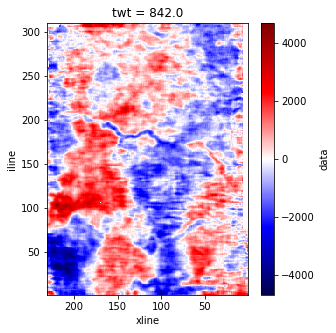

In [11]:
fig, ax = plt.subplots(figsize=(4.5,5))
ST3D_volume.data.sel(twt=842).plot.imshow(ax=ax, cmap='seismic')
ax.invert_xaxis()

In [12]:
ST3D_volume_df = ST3D_volume.to_dataframe()
ST3D_volume_df

data      cdp_x     cdp_y
iline twt    xline                           
2     0.0    1       0.0  2193745.0  705550.0
             2       0.0  2193690.0  705550.0
             3       0.0  2193635.0  705550.0
             4       0.0  2193580.0  705550.0
             5       0.0  2193525.0  705550.0
...                  ...        ...       ...
310   3000.0 226     0.0  2181370.0  722490.0
             227     0.0  2181315.0  722490.0
             228     0.0  2181260.0  722490.0
             229     0.0  2181205.0  722490.0
             230     0.0  2181150.0  722490.0

[106676070 rows x 3 columns]

In [13]:
ST3D_volume_df_rsidx = ST3D_volume_df.reset_index()
ST3D_volume_df_rsidx

,iline,twt,xline,data,cdp_x,cdp_y
0,2,0.0,1,0.0,2193745.0,705550.0
1,2,0.0,2,0.0,2193690.0,705550.0
2,2,0.0,3,0.0,2193635.0,705550.0
3,2,0.0,4,0.0,2193580.0,705550.0
4,2,0.0,5,0.0,2193525.0,705550.0
...,...,...,...,...,...,...
106676065,310,3000.0,226,0.0,2181370.0,722490.0
106676066,310,3000.0,227,0.0,2181315.0,722490.0
106676067,310,3000.0,228,0.0,2181260.0,722490.0
106676068,310,3000.0,229,0.0,2181205.0,722490.0


### Extract 1D Signal

Trace - Iline 2 / Xline 1

In [14]:
signal = ST3D_volume_df_rsidx[ST3D_volume_df_rsidx.iline==2]
signal = signal[signal.xline==1]
signal = signal.data.values
signal.shape

(1501,)

In [15]:
time = ST3D_volume_df_rsidx[ST3D_volume_df_rsidx.iline==2]
time = time[time.xline==1]
time = time.twt.values
time.shape

(1501,)

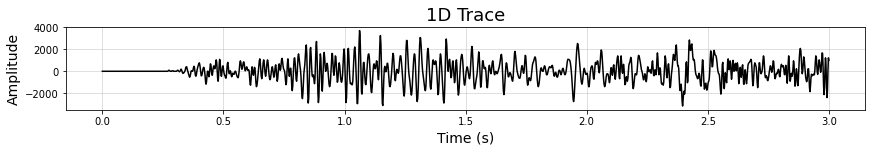

In [16]:
fig, ax = plt.subplots(figsize=(12,2), constrained_layout=True)
ax.plot(time/1e3, signal, color='k')
ax.set_xlabel('Time (s)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('1D Trace', size=18)
ax.grid(alpha=0.5)

### Extract 2D Signal

Section - Xline 110

In [17]:
signal_2D = ST3D_volume_df_rsidx[ST3D_volume_df_rsidx.xline==110]
signal_2D = signal_2D.data.values
signal_2D = signal_2D.reshape(309, 1501)
signal_2D.shape

(309, 1501)

In [18]:
iline_2D = ST3D_volume_df_rsidx[ST3D_volume_df_rsidx.xline==110]
iline_2D = iline_2D.iline.values
iline_2D = iline_2D.reshape(309, 1501)
iline_2D.shape

(309, 1501)

In [19]:
twt_2D = ST3D_volume_df_rsidx[ST3D_volume_df_rsidx.xline==110]
twt_2D = twt_2D.twt.values
twt_2D = twt_2D.reshape(309, 1501)
twt_2D.shape

(309, 1501)

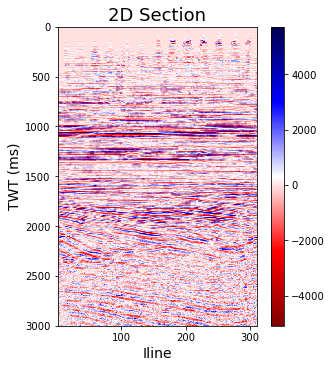

In [20]:
fig, ax = plt.subplots(figsize=(4.5,5), constrained_layout=True)
im = ax.pcolormesh(iline_2D, twt_2D, signal_2D, shading='auto', cmap='seismic_r')
ax.set_xlim([np.amin(iline_2D), np.amax(iline_2D)])
ax.set_ylim([np.amin(twt_2D), np.amax(twt_2D)])
ax.set_xlabel('Iline', size=14)
ax.set_ylabel('TWT (ms)', size=14)
ax.set_title('2D Section', size=18)
ax.invert_yaxis()
fig.colorbar(im, ax=ax)

### Extract 3D Signal

Full Volume

In [21]:
signal_3D = ST3D_volume_df_rsidx
signal_3D = signal_3D.data.values
signal_3D = signal_3D.reshape(309, 1501, 230)
signal_3D = signal_3D.transpose(0, 2, 1)
signal_3D.shape

(309, 230, 1501)

In [22]:
iline_3D = ST3D_volume_df_rsidx
iline_3D = iline_3D.iline.values
iline_3D = iline_3D.reshape(309, 1501, 230)
iline_3D = iline_3D.transpose(0, 2, 1)
iline_3D.shape

(309, 230, 1501)

In [23]:
xline_3D = ST3D_volume_df_rsidx
xline_3D = xline_3D.xline.values
xline_3D = xline_3D.reshape(309, 1501, 230)
xline_3D = xline_3D.transpose(0, 2, 1)
xline_3D.shape

(309, 230, 1501)

In [24]:
twt_3D = ST3D_volume_df_rsidx
twt_3D = twt_3D.twt.values
twt_3D = twt_3D.reshape(309, 1501, 230)
twt_3D = twt_3D.transpose(0, 2, 1)
twt_3D.shape

(309, 230, 1501)

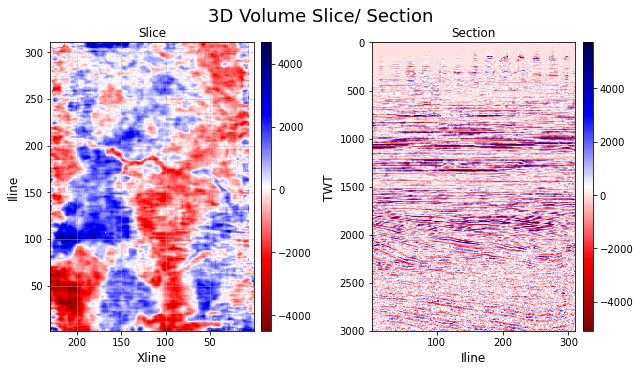

In [25]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(9,5), gridspec_kw={'width_ratios':[4,4]}, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(xline_3D[:,:,421], iline_3D[:,:,421], signal_3D[:,:,421], shading='auto', cmap='seismic_r')
        ax.set_xlabel('Xline', size=12)
        ax.set_ylabel('Iline', size=12)
        ax.set_title('Slice', size=12)
        ax.invert_xaxis()
        ax.grid(alpha=0.5)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], ax=ax, cax=cax)
    elif i == 1:
        im[i] = ax.pcolormesh(iline_3D[:,110-1,:], twt_3D[:,110-1,:], signal_3D[:,110-1,:], shading='auto', cmap='seismic_r')
        ax.set_xlabel('Iline', size=12)
        ax.set_ylabel('TWT', size=12)
        ax.set_title('Section', size=12)
        ax.invert_yaxis()
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], ax=ax, cax=cax)

fig.text(0.5,1.0, '3D Volume Slice/ Section', ha='center', va='center', size=18)
plt.tight_layout()

### 1D Fast Fourier Transform (FFT)

In [26]:
dt = 0.002  # sample rate
fs = 1/dt  # sample frequency
n = signal.size  # wavelength

#### Real Transform

In [27]:
from scipy.fft import rfft, rfftfreq

In [28]:
# frequency
rfft_freq = rfftfreq(n, dt)

In [29]:
# FFT of real signal
rfft_signal = rfft(signal)

# FFT amplitude
rfft_amp = np.abs(rfft_signal)
rfft_amp_norm = rfft_amp/np.max(rfft_amp)

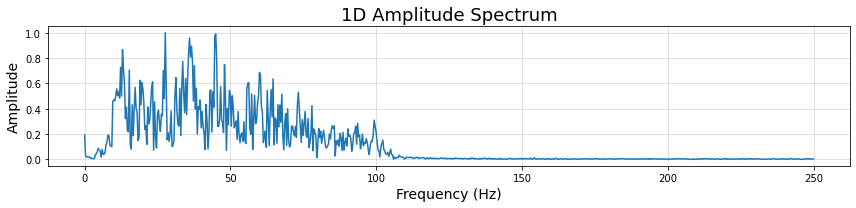

In [30]:
fig, ax = plt.subplots(figsize=(12,3))
ax.plot(rfft_freq, rfft_amp_norm)
ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('1D Amplitude Spectrum', size=18)
ax.grid(alpha=0.5)
plt.tight_layout()

### 2D Fast Fourier Transform (FFT)

In [31]:
from scipy.fft import rfft2

In [32]:
# FFT of real signal
rfft_signal_2D = rfft2(signal_2D)

# FFT amplitude
rfft_amp_2D = np.abs(rfft_signal_2D)
rfft_amp_2D_avg = np.mean(rfft_amp_2D, axis=0)
rfft_amp_2D_avg_norm = rfft_amp_2D_avg/np.max(rfft_amp_2D_avg)

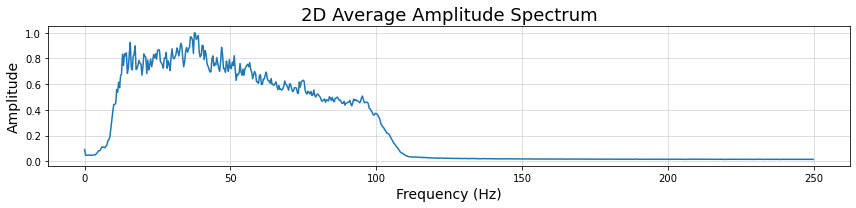

In [33]:
fig, ax = plt.subplots(figsize=(12,3))
ax.plot(rfft_freq, rfft_amp_2D_avg_norm)
ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('2D Average Amplitude Spectrum', size=18)
ax.grid(alpha=0.5)
plt.tight_layout()

#### Most Prominent Spectral Components

In [34]:
from scipy.signal import find_peaks

In [35]:
peaks_2D, peaks_prop_2D = find_peaks(rfft_amp_2D_avg_norm, distance=14, prominence=0.07)

In [36]:
mp_spec_comps_2D = list(rfft_freq[peaks_2D])
mp_spec_comps_2D = [round(i) for i in mp_spec_comps_2D]
mp_spec_comps_2D

[16, 20, 25, 33, 38, 47, 57, 62, 69, 75, 95]

In [37]:
peaks_prop_2D

{'prominences': array([0.25493211, 0.15333498, 0.16093177, 0.18110532, 0.95349711,
        0.19148844, 0.13785625, 0.09594148, 0.07057804, 0.10297292,
        0.07603797]),
 'left_bases': array([  7,  59,  59,  59,   7, 129, 156, 182, 203, 220, 275], dtype=int64),
 'right_bases': array([ 59,  64,  88, 102, 716, 716, 716, 716, 220, 716, 716], dtype=int64)}

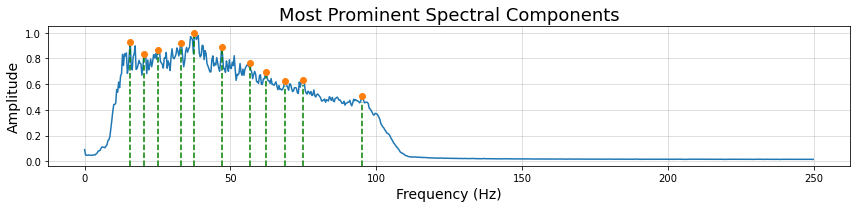

In [38]:
fig, ax = plt.subplots(figsize=(12,3))
ax.plot(rfft_freq, rfft_amp_2D_avg_norm)
for i in range(len(peaks_2D)):
    ax.axvline(rfft_freq[peaks_2D[i]], ymin=0, ymax=rfft_amp_2D_avg_norm[peaks_2D[i]]-0.05, ls='--', c='g')
ax.plot(rfft_freq[peaks_2D], rfft_amp_2D_avg_norm[peaks_2D], 'o')
ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('Most Prominent Spectral Components', size=18)
ax.grid(alpha=0.5)
plt.tight_layout()

#### Peak Spectral Component

In [39]:
amp_mode_2D = np.where(rfft_amp_2D_avg_norm==np.max(rfft_amp_2D_avg_norm))
peak_spec_comp_2D = np.int(np.round(rfft_freq[amp_mode_2D]))
peak_spec_comp_2D

38

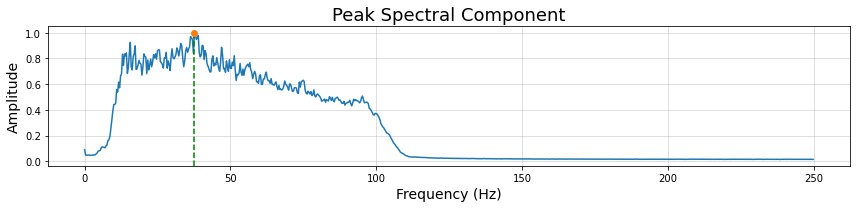

In [40]:
fig, ax = plt.subplots(figsize=(12,3))
ax.plot(rfft_freq, rfft_amp_2D_avg_norm)
ax.axvline(rfft_freq[amp_mode_2D], ymin=0, ymax=rfft_amp_2D_avg_norm[amp_mode_2D]-0.05, ls='--', c='g')
ax.plot(rfft_freq[amp_mode_2D], rfft_amp_2D_avg_norm[amp_mode_2D], 'o')
ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('Peak Spectral Component', size=18)
ax.grid(alpha=0.5)
plt.tight_layout()

### 3D Fast Fourier Transform (FFT)

In [41]:
from scipy.fft import rfftn

In [42]:
# create subvolume (100ms window)
sub_signal_3D = signal_3D[:,:,400:-1050]  # twt 800-900ms

In [43]:
sub_signal_3D.shape

(309, 230, 51)

In [44]:
# frequency (subvolume)
n_3D = sub_signal_3D.shape[-1]
rfft_freq_3D = rfftfreq(n_3D, dt)

In [45]:
# FFT of real signal
rfft_signal_3D = rfftn(sub_signal_3D)

# FFT amplitude
rfft_amp_3D = np.abs(rfft_signal_3D)
rfft_amp_3D_avg = np.mean(rfft_amp_3D, axis=(0,1))
rfft_amp_3D_avg_norm = rfft_amp_3D_avg/np.max(rfft_amp_3D_avg)

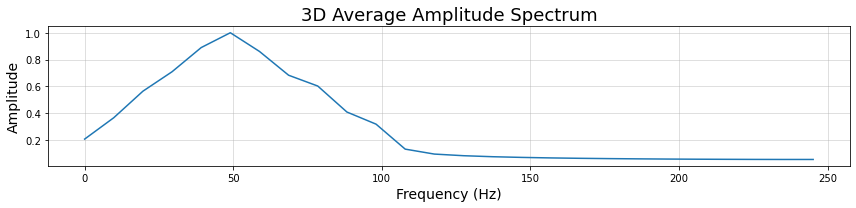

In [46]:
fig, ax = plt.subplots(figsize=(12,3))
ax.plot(rfft_freq_3D, rfft_amp_3D_avg_norm)
ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('3D Average Amplitude Spectrum', size=18)
ax.grid(alpha=0.5)
plt.tight_layout()

#### Peak Spectral Component

In [47]:
amp_mode_3D = np.where(rfft_amp_3D_avg_norm==np.max(rfft_amp_3D_avg_norm))
peak_spec_comp_3D = np.int(np.round(rfft_freq_3D[amp_mode_3D]))
peak_spec_comp_3D

49

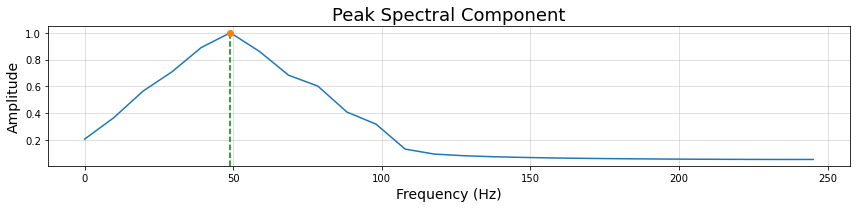

In [48]:
fig, ax = plt.subplots(figsize=(12,3))
ax.plot(rfft_freq_3D, rfft_amp_3D_avg_norm)
ax.axvline(rfft_freq_3D[amp_mode_3D], ymin=0, ymax=rfft_amp_3D_avg_norm[amp_mode_3D]-0.05, ls='--', c='g')
ax.plot(rfft_freq_3D[amp_mode_3D], rfft_amp_3D_avg_norm[amp_mode_3D], 'o')
ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('Peak Spectral Component', size=18)
ax.grid(alpha=0.5)
plt.tight_layout()

#### Low/High Band Spectral Component

In [49]:
freq_std_3D = np.std(rfft_freq_3D)
low_spec_comp_3D = np.round(peak_spec_comp_3D-freq_std_3D/4)
high_spec_comp_3D = np.round(peak_spec_comp_3D+freq_std_3D/4)
low_spec_comp_3D, high_spec_comp_3D

(31.0, 67.0)

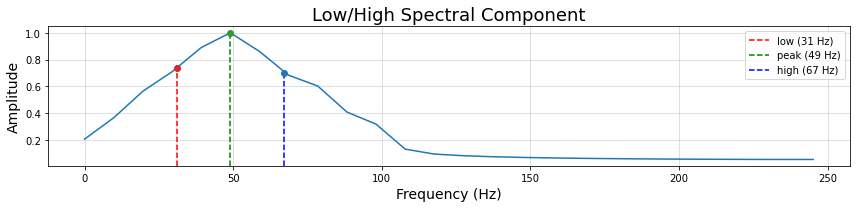

In [50]:
fig, ax = plt.subplots(figsize=(12,3))
psd_freq_3D = np.linspace(0,250,251)
ax.plot(rfft_freq_3D, rfft_amp_3D_avg_norm)

ax.axvline(psd_freq_3D[psd_freq_3D==low_spec_comp_3D], ymax=0.73, ls='--', c='r', label='low (31 Hz)')
ax.plot(psd_freq_3D[psd_freq_3D==low_spec_comp_3D], 0.74, 'o', color='tab:red')

ax.axvline(rfft_freq_3D[amp_mode_3D], ymin=0, ymax=rfft_amp_3D_avg_norm[amp_mode_3D]-0.05, ls='--', c='g', label='peak (49 Hz)')
ax.plot(rfft_freq_3D[amp_mode_3D], rfft_amp_3D_avg_norm[amp_mode_3D], 'o', color='tab:green')

ax.axvline(psd_freq_3D[psd_freq_3D==high_spec_comp_3D], ymax=0.69, ls='--', c='b', label='high (67 Hz)')
ax.plot(psd_freq_3D[psd_freq_3D==high_spec_comp_3D], 0.70, 'o', color='tab:blue')

ax.set_xlabel('Frequency (Hz)', size=14)
ax.set_ylabel('Amplitude', size=14)
ax.set_title('Low/High Spectral Component', size=18)
ax.legend()
ax.grid(alpha=0.5)
plt.tight_layout()

### Morlet Wavelet

In [51]:
import pywt

In [52]:
# view continuous wavelet types
continuous_waveletlist = pywt.wavelist(kind='continuous')
print(continuous_waveletlist)

['cgau1', 'cgau2', 'cgau3', 'cgau4', 'cgau5', 'cgau6', 'cgau7', 'cgau8', 'cmor', 'fbsp', 'gaus1', 'gaus2', 'gaus3', 'gaus4', 'gaus5', 'gaus6', 'gaus7', 'gaus8', 'mexh', 'morl', 'shan']


In [53]:
# view properties of Morlet wavelet
morl_wavelet = pywt.ContinuousWavelet('morl')
print(morl_wavelet)

ContinuousWavelet morl
  Family name:    Morlet wavelet
  Short name:     morl
  Symmetry:       symmetric
  DWT:            False
  CWT:            True
  Complex CWT:    False


### Frequency to Scale Conversion

Fps = Fc / scale

Feq = Fps / dt

where:

Fps - pseudo frequency

Fc - central frequency of the wavelet

Feq - equivalent frequency or central frequency of the signal

dt - sample rate

In [54]:
dt = 0.002  # sample rate
fs = 1/dt  # sample frequency
fn = fs/2  # nyquist frequency
print('Sample Rate: {}s'.format(dt), '\n' 'Sample Frequency: {}Hz'.format(fs), '\n' 'Nyquist Frequency: {}Hz'.format(fn))

Sample Rate: 0.002s 
Sample Frequency: 500.0Hz 
Nyquist Frequency: 250.0Hz


In [55]:
# determine central frequency of the Morlet Wavelet
Fc = pywt.central_frequency(wavelet='morl')
print('Morlet Central Frequency: {}'.format(Fc))

Morlet Central Frequency: 0.8125


#### 1D Case

In [56]:
# determine corresponding scales for nyquist bandwidth
Feq = np.arange(1,fn+1)
scales = [i for i in range(len(Feq))]
for i in range(len(Feq)):
    scales[i] = Fc/(Feq[i]*dt)

In [57]:
# verify scale-frequency equivalence
Feq_n = pywt.scale2frequency(wavelet='morl', scale=scales)/dt
print(np.round(Feq_n)==Feq)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  T

#### 2D Case

In [58]:
# determine corresponding scales for most prominent spectral components
mp_Feq_2D = mp_spec_comps_2D
mp_scales_2D = [i for i in range(len(mp_Feq_2D))]
for i in range(len(mp_Feq_2D)):
    mp_scales_2D[i] = Fc/(mp_Feq_2D[i]*dt)

# determine corresponding scale for peak spectral component
peak_Feq_2D = peak_spec_comp_2D
peak_scale_2D = Fc/(peak_Feq_2D*dt)

print('Most Prominent Scales: {}'.format(mp_scales_2D), '\n' 'Peak Scale: {}'.format(peak_scale_2D))

Most Prominent Scales: [25.390625, 20.3125, 16.25, 12.31060606060606, 10.69078947368421, 8.643617021276595, 7.12719298245614, 6.55241935483871, 5.887681159420289, 5.416666666666667, 4.276315789473684] 
Peak Scale: 10.69078947368421


In [59]:
# verify scale-frequency equivalence
mp_Feq_2D_n = pywt.scale2frequency(wavelet='morl', scale=mp_scales_2D)/dt
peak_Feq_2D_n = pywt.scale2frequency(wavelet='morl', scale=peak_scale_2D)/dt
print(mp_Feq_2D_n==mp_Feq_2D)
print(peak_Feq_2D_n==peak_Feq_2D)

[ True  True  True  True  True  True  True  True  True  True  True]
True


#### 3D Case

In [60]:
# determine corresponding scale for low spectral component
low_Feq_3D = low_spec_comp_3D
low_scale_3D = Fc/(low_Feq_3D*dt)

# determine corresponding scale for peak spectral component
peak_Feq_3D = peak_spec_comp_3D
peak_scale_3D = Fc/(peak_Feq_3D*dt)

# determine corresponding scale for low spectral component
high_Feq_3D = high_spec_comp_3D
high_scale_3D = Fc/(high_Feq_3D*dt)

print('Low Scale: {}'.format(low_scale_3D), '\n' 'Peak Scale: {}'.format(peak_scale_3D), '\n' 
      'high Scale: {}'.format(high_scale_3D))

Low Scale: 13.10483870967742 
Peak Scale: 8.290816326530612 
high Scale: 6.063432835820895


In [61]:
# verify scale-frequency equivalence
low_Feq_3D_n = pywt.scale2frequency(wavelet='morl', scale=low_scale_3D)/dt
peak_Feq_3D_n = pywt.scale2frequency(wavelet='morl', scale=peak_scale_3D)/dt
high_Feq_3D_n = pywt.scale2frequency(wavelet='morl', scale=high_scale_3D)/dt
print(low_Feq_3D_n==low_Feq_3D, peak_Feq_3D_n==peak_Feq_3D, high_Feq_3D_n==high_Feq_3D)

True True True


### 1D Continuous Wavelet Transform (CWT)

In [62]:
coefs, frequencies = pywt.cwt(signal, scales=scales, wavelet='morl', sampling_period=0.002, axis=-1)

In [63]:
coefs.shape, frequencies.size

((250, 1501), 250)

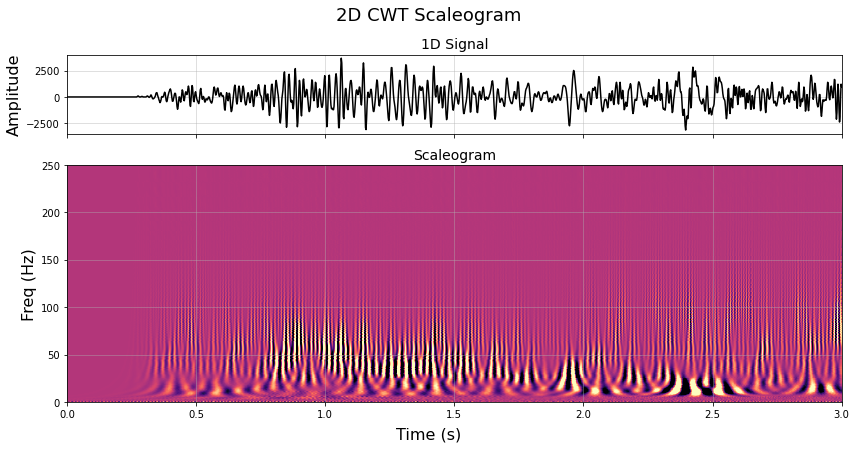

In [64]:
fig, axs = plt.subplots(figsize=(12,6), nrows=2, gridspec_kw={'height_ratios':[1.5,4.5]})
axs[0].plot(time/1e3, signal, color='k')
axs[0].set_xlim([min(time)/1e3, max(time)/1e3])
axs[0].set_ylabel('Amplitude', size=16)
axs[0].set_title('1D Signal', size=14)
axs[0].set_xticklabels([])
axs[0].grid(alpha=0.5)

axs[1].pcolormesh(time/1e3, frequencies, coefs, cmap='magma', shading='auto', 
                  vmin=np.percentile(coefs, 1), vmax=np.percentile(coefs, 99))
axs[1].set_xlim([min(time)/1e3, max(time)/1e3])
axs[1].set_ylim([0, fn])
axs[1].set_ylabel('Freq (Hz)', size=16)
axs[1].set_title('Scaleogram', size=14)
axs[1].grid(alpha=0.5)
fig.text(0.5,-0.01, 'Time (s)', ha='center', va='center', size=16)
plt.suptitle('2D CWT Scaleogram', size=18)
plt.tight_layout()

In [65]:
cff = np.linspace(0,250,coefs.shape[0])
ctt = np.linspace(0,3,coefs.shape[1])
cFF, cTT = np.meshgrid(cff, ctt)

(262.5, -12.5, -0.15000000000000002, 3.15)

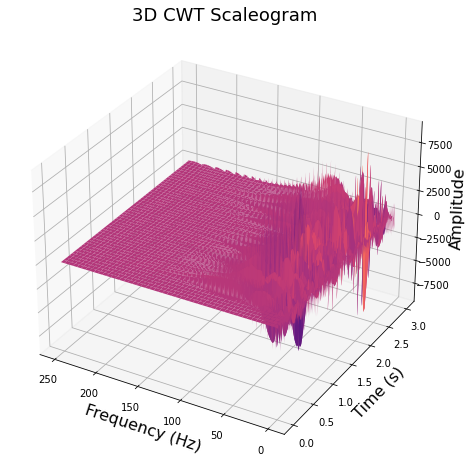

In [66]:
fig = plt.figure(figsize=(8,8)) 
ax = plt.axes(projection='3d')
ax.plot_surface(cFF, cTT, coefs.T, cmap='magma',
                vmin=np.percentile(coefs, 1), vmax=np.percentile(coefs, 99))
ax.set_xlabel('Frequency (Hz)', size=16)
ax.set_ylabel('Time (s)', size=16)
ax.set_zlabel('Amplitude', size=16)
ax.set_title('3D CWT Scaleogram', size=18)
ax.grid(alpha=0.5)
ax.invert_xaxis()
ax.axis('tight')

 ### 2D Continuous Wavelet Transform (CWT)

In [67]:
from scipy import ndimage
from scipy.signal import hilbert, argrelmin

In [68]:
# extract CWT wavelet coefficients
coefs_2D, frequencies_2D = pywt.cwt(signal_2D, scales=scales, wavelet='morl', sampling_period=0.002, axis=-1)

In [69]:
coefs_2D.shape, frequencies_2D.size

((250, 309, 1501), 250)

In [70]:
# CWT average amplitude
coefs_2D_avg = np.mean(coefs_2D, axis=1)

# seismic average ampitude
signal_2D_avg = np.mean(signal_2D, axis=0)

In [71]:
coefs_2D_avg.shape, signal_2D_avg.shape

((250, 1501), (1501,))

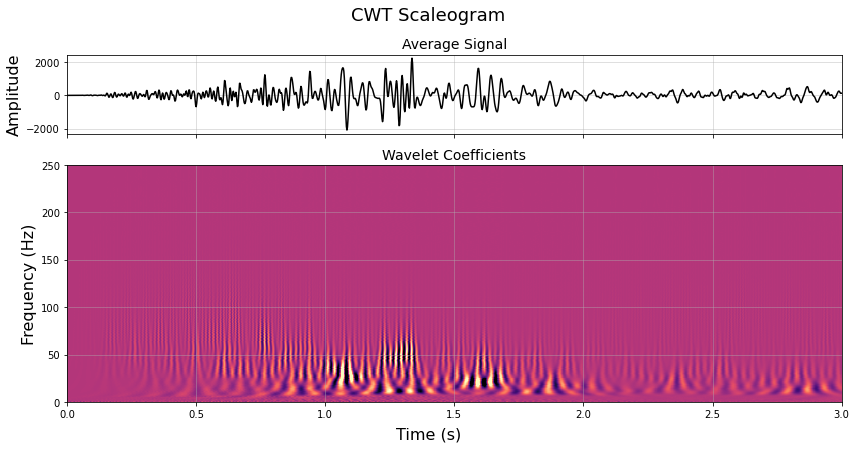

In [72]:
# view wavelet coefficients
fig, axs = plt.subplots(figsize=(12,6), nrows=2, gridspec_kw={'height_ratios':[1.5,4.5]})
axs[0].plot(time/1e3, signal_2D_avg, color='k')
axs[0].set_xlim([min(time)/1e3, max(time)/1e3])
axs[0].set_ylabel('Amplitude', size=16)
axs[0].set_title('Average Signal', size=14)
axs[0].set_xticklabels([])
axs[0].grid(alpha=0.5)

axs[1].pcolormesh(time/1e3, frequencies_2D, coefs_2D_avg, cmap='magma', shading='auto', 
                  vmin=np.percentile(coefs, 1), vmax=np.percentile(coefs, 99))
axs[1].set_xlim([min(time)/1e3, max(time)/1e3])
axs[1].set_ylim([0, fn])
axs[1].set_ylabel('Frequency (Hz)', size=16)
axs[1].set_title('Wavelet Coefficients', size=14)
axs[1].grid(alpha=0.5)
fig.text(0.5,-0.01, 'Time (s)', ha='center', va='center', size=16)
plt.suptitle('CWT Scaleogram', size=18)
plt.tight_layout()

In [73]:
# spectral voices (real component of the complex transform)
spec_voice_2D = coefs_2D

# spectral magnitudes (root of the squares of the real and imaginary components)
spec_mag_2D = np.abs(hilbert(coefs_2D, axis=-1))

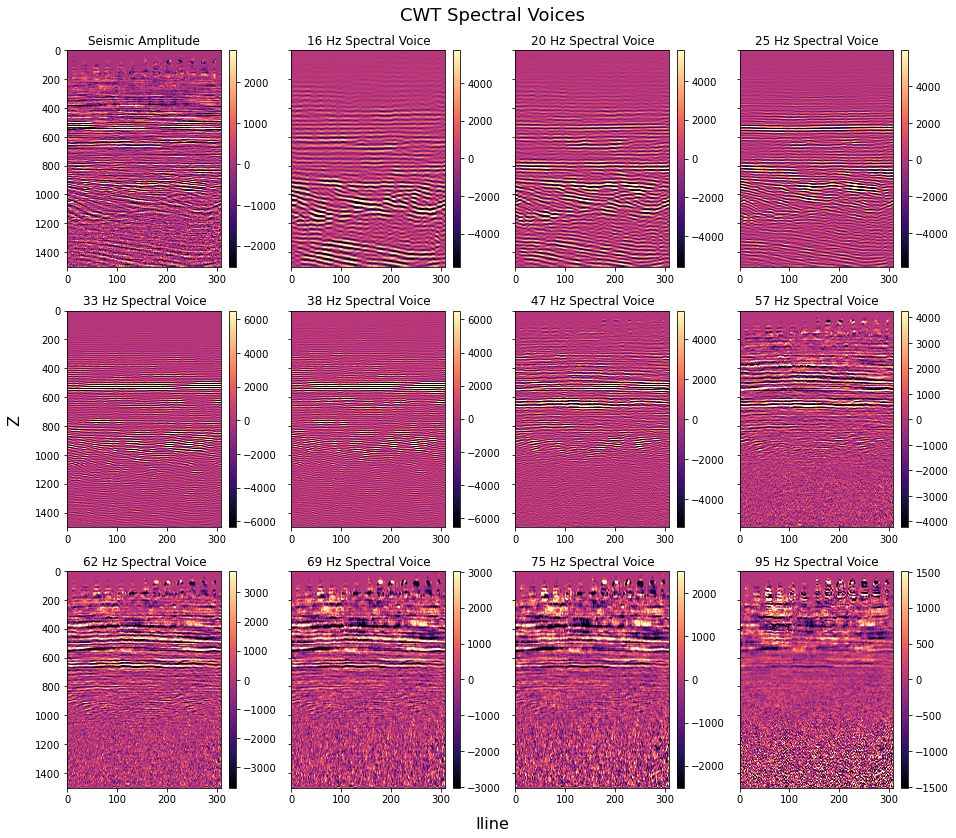

In [74]:
# compare spectral voice of most prominent spectral components
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(13,11), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(signal_2D.T, shading='auto', cmap='magma', 
                              vmin=np.percentile(signal_2D, 1), 
                              vmax=np.percentile(signal_2D, 99))
        ax.set_title('Seismic Amplitude', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(spec_voice_2D[mp_spec_comps_2D[i-1]-1,:,:].T, 
                              shading='auto', cmap='magma', 
                              vmin=np.percentile(spec_voice_2D[mp_spec_comps_2D[i-1]-1,:,:], 1), 
                              vmax=np.percentile(spec_voice_2D[mp_spec_comps_2D[i-1]-1,:,:], 99))
        ax.set_title('%s' %'{} Hz Spectral Voice'.format(mp_spec_comps_2D[i-1]), size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'CWT Spectral Voices', ha='center', va='center', size=18)
plt.tight_layout()

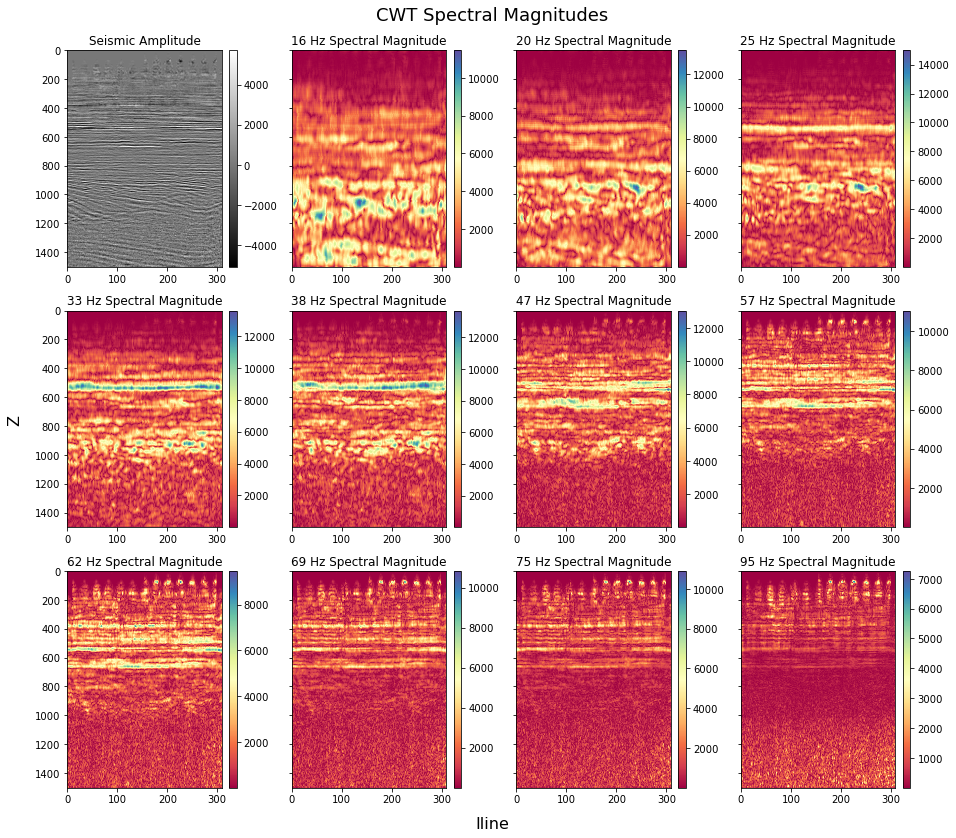

In [75]:
# compare spectral magnitude of most prominent spectral components
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(13,11), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(signal_2D.T, shading='auto', cmap='gray', 
                              vmin=np.percentile(signal_2D, 0), 
                              vmax=np.percentile(signal_2D, 100))
        ax.set_title('Seismic Amplitude', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(spec_mag_2D[mp_spec_comps_2D[i-1]-1,:,:].T, 
                              shading='auto', cmap='Spectral', 
                              vmin=np.percentile(spec_mag_2D[mp_spec_comps_2D[i-1]-1,:,:], 0), 
                              vmax=np.percentile(spec_mag_2D[mp_spec_comps_2D[i-1]-1,:,:], 100))
        ax.set_title('%s' %'{} Hz Spectral Magnitude'.format(mp_spec_comps_2D[i-1]), size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'CWT Spectral Magnitudes', ha='center', va='center', size=18)
plt.tight_layout()

#### Seismic Attributes 2D

Instanteneous amplitude (trace envelope or reflection strength) = |C| = sqrt(R** 2 + I** 2) 

Instanteneous phase (rotation angle) = arctan(I/R)

Instanteneous frequency = dphi/dt = d(arctan(I/R))/dt = (R*(dI/dt) - I*(dR/dt))/(R** 2 + I** 2)

where: 

C- complex or analytical trace

R- real or seismic trace 

I- imaginary or hilbert trace

t- time

Response attributes are computed at the peaks of the instantaneous amplitude (envelope) between two troughs.

In [76]:
# create complex trace attributes function
def traces_2D(real, dt):
    
    # signal components
    R_trace = real
    C_trace = hilbert(R_trace, axis=-1)
    I_trace = np.imag(C_trace)
        
    # instantaneous attributes
    env = np.abs(C_trace)  # envelope
    phase = np.rad2deg(np.angle(C_trace))  # phase
    freq = np.abs((1/(2*np.pi))*(np.gradient(np.unwrap(np.deg2rad(phase)), dt, axis=-1)))  # frequency
    
    # rac = np.gradient(env, dt, axis=-1)/env  # relative amplitude change
    # band = (1/(2*np.pi))*np.abs(rac)  # instantaneous bandwidth
    # dom_freq = np.hypot(freq, band)  # dominant frequency
    # sweet = env/np.sqrt(dom_freq)  # sweetness
    
    def rms(real):
        rms = np.sqrt(np.mean(real**2))
        return rms
    
    rms_env = ndimage.generic_filter(env, rms, size=(3,3), mode='reflect')  # root mean square envelope
    med_phase = ndimage.median_filter(phase, size=(3,3), mode='reflect')  # median filtered phase
    med_freq = ndimage.median_filter(freq, size=(3,3), mode='reflect')  # median filtered frequency
    
    # create a boolean array of trough locations
    troughs_idx = argrelmin(env, axis=-1, order=1, mode='clip')
    troughs = np.zeros(env.shape, dtype=bool)
    troughs[troughs_idx] = True
    troughs = np.cumsum(troughs, axis=-1)
    
    def response(envelope, real, phase, freq, troughs):
        # response attributes
        resp_env = np.zeros(envelope.shape)
        resp_phase = np.zeros(envelope.shape)
        resp_freq = np.zeros(envelope.shape)
        app_pol = np.zeros(envelope.shape)
        
        for i in np.ndindex(envelope.shape[:-1]):
            # unique classes (True or False)
            ints = np.unique(troughs[i, :])
            
            for ii in ints:
                idx = np.where(troughs[i, :] == ii)[1]
                peak = idx[envelope[i, idx].argmax()]
                
                resp_env[i, idx] = envelope[i, peak]  # response envelope
                resp_phase[i, idx] = phase[i, peak]  # response phase
                resp_freq[i, idx] = freq[i, peak]  # response frequency
                app_pol[i, idx] = envelope[i, peak] * np.sign(real[i, peak]) # apparent polarity
                
        return resp_env, resp_phase, resp_freq, app_pol
    
    resp_env, resp_phase, resp_freq, app_pol = response(env, R_trace, phase, freq, troughs)
    
    return env, phase, freq, resp_env, resp_phase, resp_freq, rms_env, med_phase, med_freq

In [77]:
# create edge detection attributes function
def edges_2D(data, zwin, window):
    
    # # crosscorrelation based coherence
    # corr_coh_2D = np.zeros_like(data)
    # nx, nz = data.shape
    # # pad data by reflecting boundary
    # padded = np.pad(data, ((0, 1), (zwin//2, zwin//2)), mode='reflect')
    
    # for x, z, in np.ndindex(nx, nz):
        # center_trace = data[x, :]  # center trace (full length of time axis)   
        # x_trace = padded[x+1, z:z+zwin]  # adjacent traces (moving window along time axis)
        # # cross correlate (output length = center_trace.size - x_trace.size + 1)
        # xcorr = np.correlate(center_trace, x_trace)
        # # maximum normalized cross correlation value
        # center_std = center_trace.std()
        # x_std = x_trace.std()
        # px = xcorr.max() / (xcorr.size * center_std * x_std)
        # corr_coh_2D[x,z] = px  # normalized crosscorrelation based coherence

    # corr_coh_2D = np.clip(corr_coh_2D, a_min=0, a_max=1)
    # corr_coh_2D = np.nan_to_num(corr_coh_2D, nan=0, posinf=1, neginf=0)
    
    # semblance based coherence
    def sembl_func(region):
        # reshape 1D generic filter input to window shape
        region = region.reshape(window)
        # reshape window to 2D array (ntraces by nsamples)
        region = region.reshape(-1, region.shape[-1])
        ntraces, nsamples = region.shape
        
        # in terms of energy ratio
        square_of_sums = np.sum(region, axis=0)**2
        sum_of_squares = np.sum(region**2, axis=0)
        sembl = square_of_sums.sum() / sum_of_squares.sum()
        
        # alternatively in terms of covariance matrix
        # cov = region.dot(region.T)
        # sembl = cov.sum() / cov.diagonal().sum()
        
        return sembl / ntraces
    
    # semblance is sensitive to amplitude and phase changes (better for stratigraphy)
    sembl_coh = ndimage.generic_filter(data, sembl_func, window)  # semblance based coherence
    sembl_coh[np.isnan(sembl_coh)] = 0
        
    # eigenstructure based coherence
    def eigenstruc_func(region):
        # reshape 1D generic filter input to window shape
        region = region.reshape(window)
        # reshape window to 2D array (ntraces by nsamples)
        region = region.reshape(-1, region.shape[-1])
        
        # ratio of the largest eigenvalue to sum of eigenvalues
        cov = region.dot(region.T)
        vals = np.linalg.eigvalsh(cov)
        eigenstruc = vals.max() / vals.sum()
        
        return eigenstruc
    
    # eigenstructure is sensitive only to phase changes (better for subtle structures)
    eigenstruc_coh = ndimage.generic_filter(data, eigenstruc_func, window)  # eigenstructure based coherence
    eigenstruc_coh[np.isnan(eigenstruc_coh)] = 0
    
    # # gradient magnitude
    # gauss_gdmg = ndimage.gaussian_gradient_magnitude(data, sigma=(1,1), mode='reflect')  
    # gauss_gdmg = gauss_gdmg/np.max(gauss_gdmg)  # normalized gaussian gradient magnitude
    
    return sembl_coh, eigenstruc_coh

In [78]:
# compute complex trace attributes
trace_attributes_2D = traces_2D(signal_2D, dt)

# compute edge detection attributes
edge_attributes_2D = edges_2D(signal_2D, zwin=None, window=(3,9))

In [79]:
edge_cmaps = ['gray', 'gray']
trace_cmaps = ['jet', 'hsv', 'gist_rainbow', 'jet', 'hsv', 'gist_rainbow', 'jet', 'hsv', 'gist_rainbow']

edge_titles = ['Semblance Based Coherence', 'Eigenstructure Based Coherence']
trace_titles = ['Trace Envelope', 'Instantaneous Phase', 'Intantaneous Frequency', 
                'Response Envelope', 'Response Phase', 'Response Frequency', 
                'RMS Envelope', 'Median Filtered Phase', 'Median Filtered Frequency']

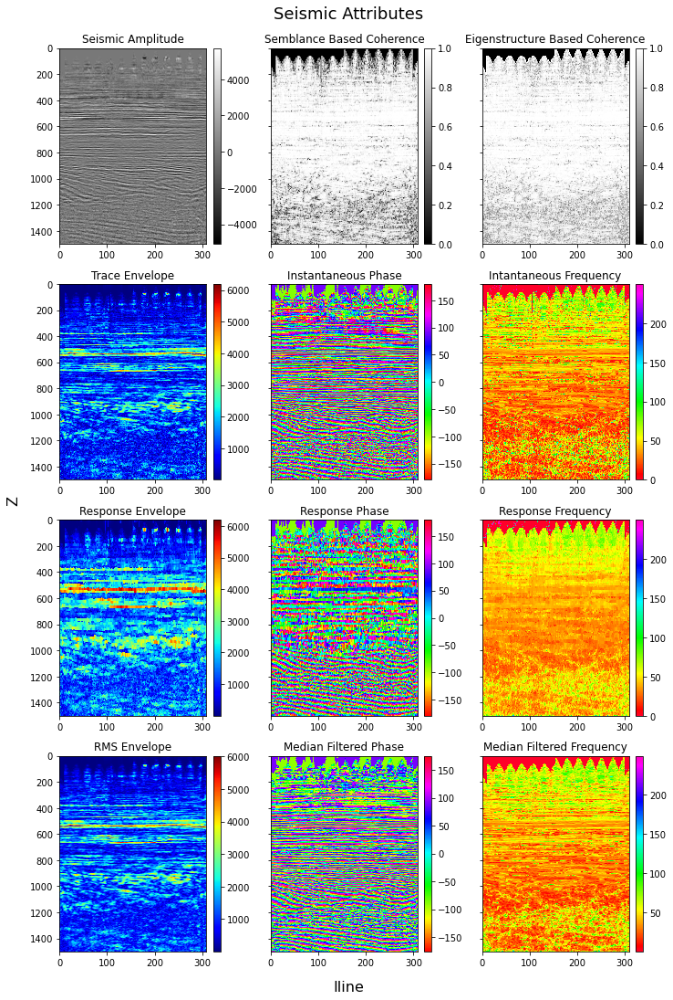

In [80]:
# view seismic attributes
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10,14.5), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(signal_2D.T, shading='auto', cmap='gray', 
                              vmin=np.percentile(signal_2D, 0), 
                              vmax=np.percentile(signal_2D, 100))
        ax.set_title('Seismic Amplitude', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i in [1,2]:
        im[i] = ax.pcolormesh(edge_attributes_2D[i-1].T, shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(edge_attributes_2D[i-1], 0), 
                              vmax=np.percentile(edge_attributes_2D[i-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(trace_attributes_2D[i-3].T, shading='auto', cmap=trace_cmaps[i-3], 
                              vmin=np.percentile(trace_attributes_2D[i-3], 0), 
                              vmax=np.percentile(trace_attributes_2D[i-3], 100))
        ax.set_title(trace_titles[i-3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Seismic Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### Principal Components 2D (Spectral Voices) 

In [81]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

In [82]:
# reshape spectral voices to 1D
mp_spec_v_2D = [i for i in range(len(mp_spec_comps_2D))]

for i in range(len(mp_spec_comps_2D)):
    mp_spec_v_2D[i] = spec_voice_2D[mp_spec_comps_2D[i]-1,:,:].reshape(-1)

In [83]:
# convert to dataframe
mp_spec_v_2D_df = pd.DataFrame(np.asarray(mp_spec_v_2D).T, columns=mp_spec_comps_2D)
mp_spec_v_2D_df

,16,20,25,33,38,47,57,62,69,75,95
0,-0.033888,-0.007578,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
1,-0.031769,-0.011367,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
2,-0.012705,-0.005684,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
3,0.014832,0.001895,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
4,0.040250,0.007578,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...
463804,1061.455933,-264.737549,-112.277176,220.937500,330.821320,447.177063,324.433289,4.561620,402.654602,174.687653,319.116516
463805,699.396790,-588.778320,-387.500122,-209.972763,-311.945831,-521.859131,-635.201111,-910.880920,-631.817566,-809.590942,-475.677094
463806,328.619171,-880.964600,-615.388062,-598.406311,-865.299072,-1252.828857,-1301.838745,-1347.268433,-1245.991577,-1181.427002,-791.706360
463807,-22.637577,-1084.952515,-759.317871,-875.542542,-1191.962769,-1519.675903,-1370.442993,-1069.084351,-1045.084106,-705.021729,-308.464966


In [84]:
# normalize spectral voices
scaled_mp_spec_v_2D = MinMaxScaler().fit_transform(mp_spec_v_2D_df)

In [85]:
# check PCA statistics
pca_v_2D = PCA(n_components=11).fit(scaled_mp_spec_v_2D)
pca_attributes_v_2D = pd.DataFrame(np.asarray([pca_v_2D.explained_variance_ratio_, 
                                               np.cumsum(pca_v_2D.explained_variance_ratio_), 
                                               pca_v_2D.singular_values_, 
                                               np.cumsum(pca_v_2D.singular_values_)]).T, 
                                   columns=['explained_variance_ratio', 'cumulative', 'singular_values', 'cumulative'])
pca_attributes_v_2D.index = ['PC{}'.format(i) for i in range(1,len(mp_spec_v_2D)+1)]
pca_attributes_v_2D

,explained_variance_ratio,cumulative,singular_values,cumulative
PC1,0.391733,0.391733,99.717255,99.717255
PC2,0.277274,0.669007,83.893784,183.611038
PC3,0.182396,0.851403,68.042915,251.653961
PC4,0.075690,0.927094,43.832447,295.486420
PC5,0.039868,0.966961,31.811653,327.298065
PC6,0.017137,0.984099,20.856627,348.154694
PC7,0.008746,0.992844,14.899565,363.054260
PC8,0.003832,0.996677,9.863118,372.917389
PC9,0.002267,0.998944,7.585455,380.502838
PC10,0.000880,0.999823,4.725234,385.228058


In [86]:
# extract first three principal components of spectral voices
PC_mp_spec_v_2D = PCA(n_components=3).fit_transform(scaled_mp_spec_v_2D)

In [87]:
PC_mp_spec_v_2D_lst = np.hsplit(PC_mp_spec_v_2D, indices_or_sections=PC_mp_spec_v_2D.shape[-1])
PC_mp_spec_v_2D_lst = [item.reshape(signal_2D.shape) for item in PC_mp_spec_v_2D_lst]

In [88]:
PC_titles = ['PC1', 'PC2', 'PC3']

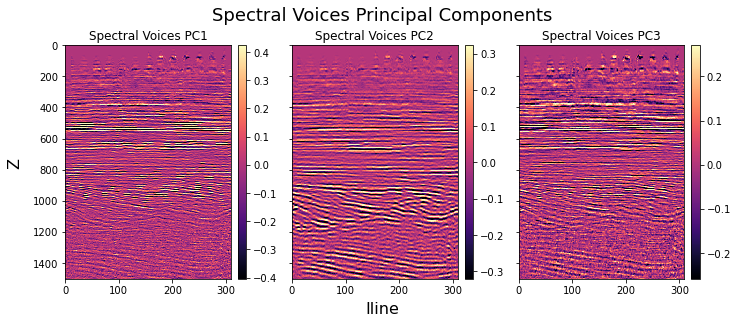

In [89]:
# view spectral voices principal components
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,4), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    im[i] = ax.pcolormesh(PC_mp_spec_v_2D_lst[i].T, shading='auto', cmap='magma', 
                          vmin=np.percentile(PC_mp_spec_v_2D_lst[i], 1), 
                          vmax=np.percentile(PC_mp_spec_v_2D_lst[i], 99))
    ax.set_title('Spectral Voices ' + PC_titles[i], size=12)
    cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
    fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Voices Principal Components', ha='center', va='center', size=18)
plt.tight_layout()

In [90]:
# compute spectral voices PC2 complex trace attributes
PC2_mp_spec_v_trace_attributes_2D = traces_2D(PC_mp_spec_v_2D_lst[1], dt)

# compute spectral voices PC2 edge detection attributes
PC2_mp_spec_v_edge_attributes_2D = edges_2D(PC_mp_spec_v_2D_lst[1], zwin=None, window=(3,9))

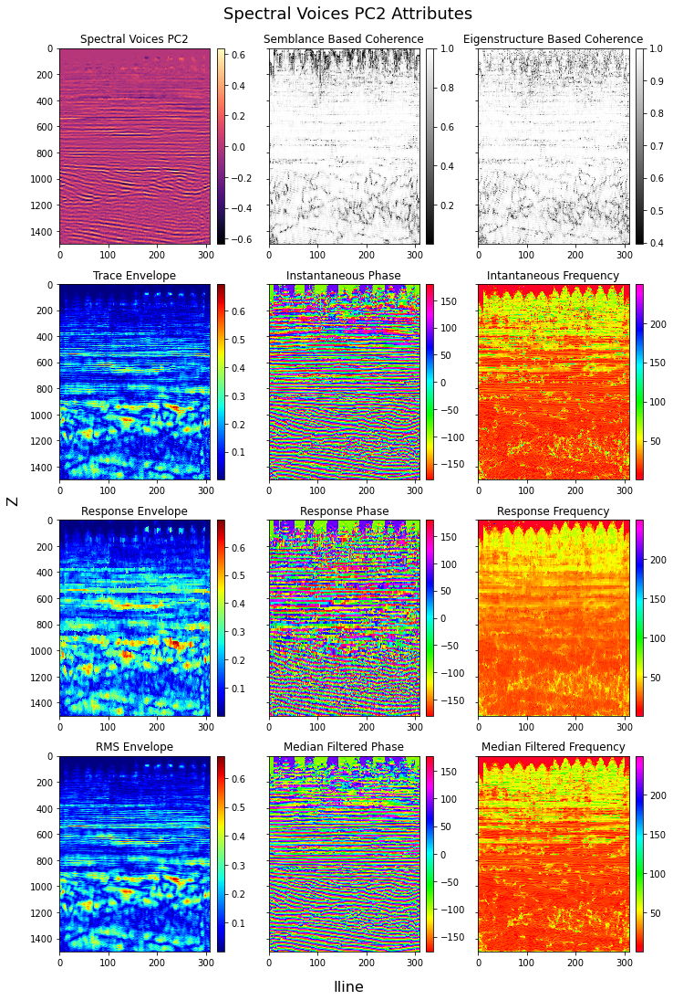

In [91]:
# view spectral voices PC2 attributes
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10,14.5), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(PC_mp_spec_v_2D_lst[1].T, shading='auto', cmap='magma', 
                              vmin=np.percentile(PC_mp_spec_v_2D_lst[1], 0), 
                              vmax=np.percentile(PC_mp_spec_v_2D_lst[1], 100))
        ax.set_title('Spectral Voices PC2', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i in [1,2]:
        im[i] = ax.pcolormesh(PC2_mp_spec_v_edge_attributes_2D[i-1].T, shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(PC2_mp_spec_v_edge_attributes_2D[i-1], 0), 
                              vmax=np.percentile(PC2_mp_spec_v_edge_attributes_2D[i-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(PC2_mp_spec_v_trace_attributes_2D[i-3].T, shading='auto', cmap=trace_cmaps[i-3], 
                              vmin=np.percentile(PC2_mp_spec_v_trace_attributes_2D[i-3], 0), 
                              vmax=np.percentile(PC2_mp_spec_v_trace_attributes_2D[i-3], 100))
        ax.set_title(trace_titles[i-3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Voices PC2 Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### Principal Components 2D (Spectral Magnitudes) 

In [92]:
# rehsape spectral maginitudes to 1D
mp_spec_m_2D = [i for i in range(len(mp_spec_comps_2D))]

for i in range(len(mp_spec_comps_2D)):
    mp_spec_m_2D[i] = spec_mag_2D[mp_spec_comps_2D[i]-1,:,:].reshape(-1)

In [93]:
# convert to dataframe
mp_spec_m_2D_df = pd.DataFrame(np.asarray(mp_spec_m_2D).T, columns=mp_spec_comps_2D)
mp_spec_m_2D_df

,16,20,25,33,38,47,57,62,69,75,95
0,2207.336592,1528.882815,881.422619,327.764014,290.747916,300.419094,53.553364,566.576711,682.627353,773.850003,336.532526
1,956.052180,831.916509,594.964514,295.752290,272.725089,305.660600,276.328915,120.558024,66.857055,75.507790,181.513575
2,974.084605,777.189666,496.141635,215.287715,183.692053,177.532317,71.651284,101.247760,147.512399,202.938815,107.974257
3,602.603695,558.350962,403.318576,201.668279,178.679922,190.580301,173.700799,88.524188,55.434069,27.579427,95.883026
4,635.780748,539.382347,353.918746,158.861567,132.503366,123.367505,62.642891,39.401051,69.263315,107.006998,62.003321
...,...,...,...,...,...,...,...,...,...,...,...
463804,1626.363764,1243.356539,798.895496,938.055688,1281.819911,1739.871121,1579.611930,1487.278480,1402.250017,1329.559073,838.087566
463805,1518.652955,1279.396052,852.705181,1007.477465,1353.548992,1768.310320,1607.573502,1472.674659,1401.607288,1271.060485,817.953258
463806,1291.361786,1138.556695,769.194383,900.201418,1224.809169,1605.619593,1510.984024,1391.411091,1339.969496,1190.065500,791.815946
463807,1190.133708,1188.352755,813.825519,987.711934,1281.555299,1548.726725,1372.695328,1199.355214,1149.010813,1025.481441,729.773358


In [94]:
# normalize spectral magnitudes
scaled_mp_spec_m_2D = MinMaxScaler().fit_transform(mp_spec_m_2D_df)

In [95]:
# check PCA statistics
pca_m_2D = PCA(n_components=11).fit(scaled_mp_spec_m_2D)
pca_attributes_m_2D = pd.DataFrame(np.asarray([pca_m_2D.explained_variance_ratio_, 
                                               np.cumsum(pca_m_2D.explained_variance_ratio_), 
                                               pca_m_2D.singular_values_, 
                                               np.cumsum(pca_m_2D.singular_values_)]).T, 
                                   columns=['explained_variance_ratio', 'cumulative', 'singular_values', 'cumulative'])
pca_attributes_m_2D.index = ['PC{}'.format(i) for i in range(1,len(mp_spec_m_2D)+1)]
pca_attributes_m_2D

,explained_variance_ratio,cumulative,singular_values,cumulative
PC1,0.463277,0.463277,193.633193,193.633193
PC2,0.261023,0.724300,145.344472,338.977665
PC3,0.129307,0.853607,102.298669,441.276334
PC4,0.055500,0.909107,67.020445,508.296780
PC5,0.044469,0.953576,59.991093,568.287872
PC6,0.022685,0.976261,42.847654,611.135526
PC7,0.013401,0.989662,32.933277,644.068803
PC8,0.006409,0.996071,22.774884,666.843687
PC9,0.003372,0.999443,16.520219,683.363906
PC10,0.000452,0.999895,6.045737,689.409642


In [96]:
# extract first three principal components of spectral magnitudes
PC_mp_spec_m_2D = PCA(n_components=3).fit_transform(scaled_mp_spec_m_2D)

In [97]:
PC_mp_spec_m_2D_lst = np.hsplit(PC_mp_spec_m_2D, indices_or_sections=PC_mp_spec_m_2D.shape[-1])
PC_mp_spec_m_2D_lst = [item.reshape(signal_2D.shape) for item in PC_mp_spec_m_2D_lst]

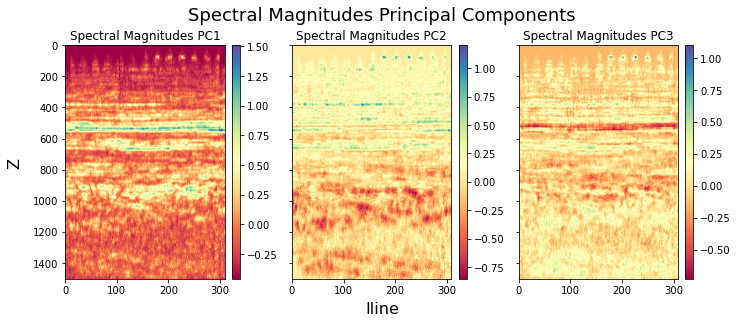

In [98]:
# view spectral magnitudes principal components
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,4), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    im[i] = ax.pcolormesh(PC_mp_spec_m_2D_lst[i].T, shading='auto', cmap='Spectral', 
                          vmin=np.percentile(PC_mp_spec_m_2D_lst[i], 0), 
                          vmax=np.percentile(PC_mp_spec_m_2D_lst[i], 100))
    ax.set_title('Spectral Magnitudes ' + PC_titles[i], size=12)
    cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
    fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Magnitudes Principal Components', ha='center', va='center', size=18)
plt.tight_layout()

In [99]:
# compute spectral magnitudes PC1 complex trace attributes
PC1_mp_spec_m_trace_attributes_2D = traces_2D(PC_mp_spec_m_2D_lst[0], dt)

# compute spectral magnitudes PC1 edge detection attributes
PC1_mp_spec_m_edge_attributes_2D = edges_2D(PC_mp_spec_m_2D_lst[0], zwin=None, window=(3,9))

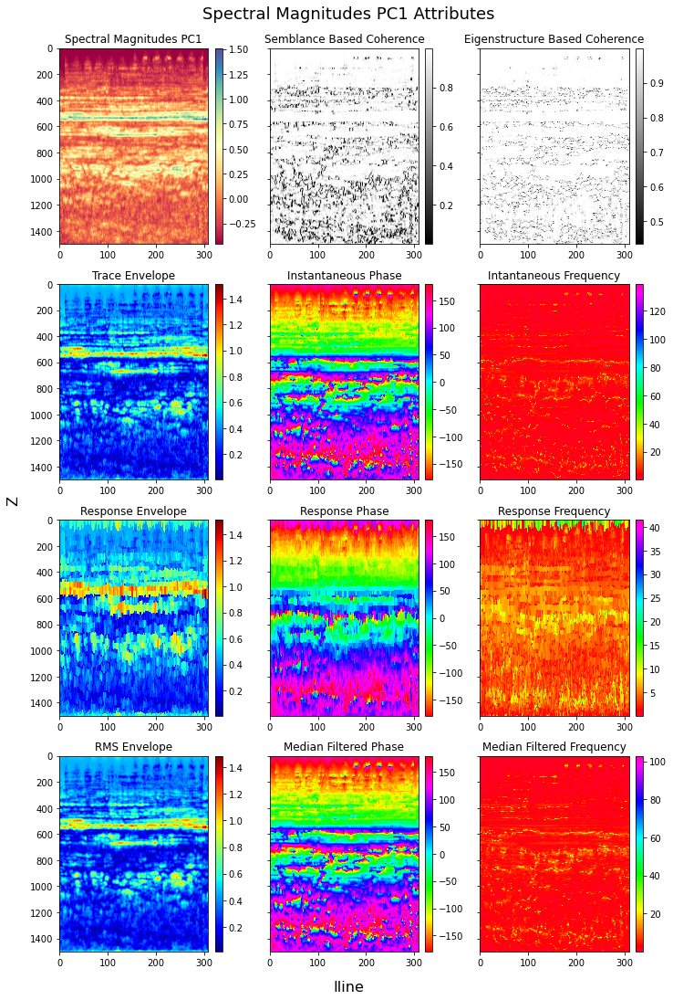

In [100]:
# view spectral magnitudes PC1 attributes
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10,14.5), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(PC_mp_spec_m_2D_lst[0].T, shading='auto', cmap='Spectral', 
                              vmin=np.percentile(PC_mp_spec_m_2D_lst[0], 0), 
                              vmax=np.percentile(PC_mp_spec_m_2D_lst[0], 100))
        ax.set_title('Spectral Magnitudes PC1', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i in [1,2]:
        im[i] = ax.pcolormesh(PC1_mp_spec_m_edge_attributes_2D[i-1].T, shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(PC1_mp_spec_m_edge_attributes_2D[i-1], 0), 
                              vmax=np.percentile(PC1_mp_spec_m_edge_attributes_2D[i-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(PC1_mp_spec_m_trace_attributes_2D[i-3].T, shading='auto', cmap=trace_cmaps[i-3], 
                              vmin=np.percentile(PC1_mp_spec_m_trace_attributes_2D[i-3], 0), 
                              vmax=np.percentile(PC1_mp_spec_m_trace_attributes_2D[i-3], 100))
        ax.set_title(trace_titles[i-3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Magnitudes PC1 Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### RGBA Color Blending 2D

Color = Red + Green + Blue

Opacity = Alpha

R(0) + B(0) + G(0) = Black

R(127) + B(127) + G(127) = Gray

R(255) + B(255) + G(255) = White

In [101]:
from matplotlib.colors import LinearSegmentedColormap

In [102]:
# check scale and data type
np.min(PC_mp_spec_v_2D_lst[0]), np.max(PC_mp_spec_v_2D_lst[0]), PC_mp_spec_v_2D_lst[0].dtype

(-0.9440257, 0.9943632, dtype('float32'))

In [103]:
# create function for grayscale conversion
def grayscale(data, mn, mx):
    return (data-mn)/(mx-mn)*255

In [104]:
# convert to grayscale
PC_mp_spec_v_2D_lst_gray = [i for i in range(len(PC_mp_spec_v_2D_lst))]

for i in range(len(PC_mp_spec_v_2D_lst)):
    PC_mp_spec_v_2D_lst_gray[i] = grayscale(PC_mp_spec_v_2D_lst[i], 
                                            np.min(PC_mp_spec_v_2D_lst[i]), 
                                            np.max(PC_mp_spec_v_2D_lst[i]))
    
sembl_based_coh_2D_gray = grayscale(edge_attributes_2D[0], 
                                    np.min(edge_attributes_2D[0]), 
                                    np.max(edge_attributes_2D[0]))

# convert to 8-bit unsigned integer
PC_mp_spec_v_2D_lst_gray = np.uint8(PC_mp_spec_v_2D_lst_gray)

sembl_based_coh_2D_gray = np.uint8(sembl_based_coh_2D_gray)

In [105]:
# check new scale and data type
np.min(PC_mp_spec_v_2D_lst_gray[0]), np.max(PC_mp_spec_v_2D_lst_gray[0]), PC_mp_spec_v_2D_lst_gray[0].dtype

(0, 255, dtype('uint8'))

In [106]:
# stack principal components in RGB channels
PC_mp_spec_v_2D_stack = np.dstack(PC_mp_spec_v_2D_lst_gray)

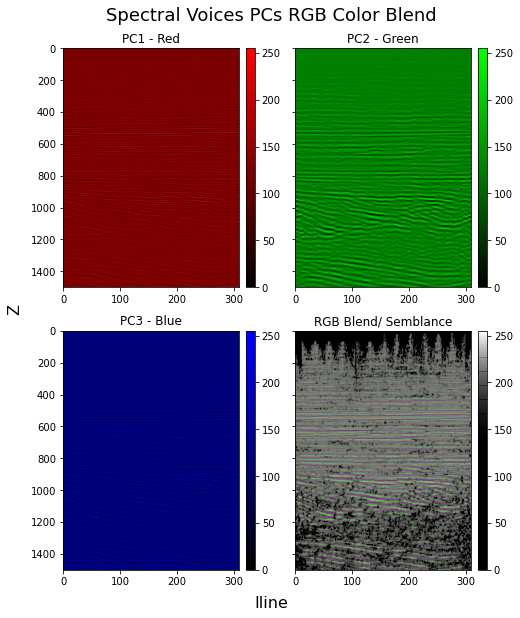

In [107]:
# view RGB principal components blend
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(7,8), sharey=True)
cmap_r = LinearSegmentedColormap.from_list(name='r', colors=[(0,0,0,1), (1,0,0,1)])
cmap_g = LinearSegmentedColormap.from_list(name='g', colors=[(0,0,0,1), (0,1,0,1)])
cmap_b = LinearSegmentedColormap.from_list(name='b', colors=[(0,0,0,1), (0,0,1,1)])
cmap_a = LinearSegmentedColormap.from_list(name='a', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,0)])
for i, ax in enumerate(fig.axes):
    if i == 0: 
        im = ax.imshow(PC_mp_spec_v_2D_lst_gray[0].T, cmap=cmap_r, aspect='auto', vmin=0, vmax=255)
        ax.set_title('%s' %PC_titles[i] + ' - Red', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 1: 
        im = ax.imshow(PC_mp_spec_v_2D_lst_gray[1].T, cmap=cmap_g, aspect='auto', vmin=0, vmax=255)
        ax.set_title('%s' %PC_titles[i] + ' - Green', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 2: 
        im = ax.imshow(PC_mp_spec_v_2D_lst_gray[2].T, cmap=cmap_b, aspect='auto', vmin=0, vmax=255)
        ax.set_title('%s' %PC_titles[i] + ' - Blue', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    else:
        im = ax.imshow(PC_mp_spec_v_2D_stack.transpose(1,0,2), aspect='auto', vmin=0, vmax=255)
        ax.set_title('RGB Blend/ Semblance', size=12)
        im2 = ax.imshow(sembl_based_coh_2D_gray.T, cmap=cmap_a, aspect='auto', vmin=0, vmax=255)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im2, cax=cax, ax=ax, orientation='vertical')
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Voices PCs RGB Color Blend', ha='center', va='center', size=18)
plt.tight_layout()

In [108]:
# check scale and data type
np.min(PC_mp_spec_m_2D_lst[0]), np.max(PC_mp_spec_m_2D_lst[0]), PC_mp_spec_m_2D_lst[0].dtype

(-0.45541294403535304, 1.5078450747941285, dtype('float64'))

In [109]:
# convert to grayscale
PC_mp_spec_m_2D_lst_gray = [i for i in range(len(PC_mp_spec_m_2D_lst))]

for i in range(len(PC_mp_spec_m_2D_lst)):
    PC_mp_spec_m_2D_lst_gray[i] = grayscale(PC_mp_spec_m_2D_lst[i], 
                                            np.min(PC_mp_spec_m_2D_lst[i]), 
                                            np.max(PC_mp_spec_m_2D_lst[i]))
    
# convert to 8-bit unsigned integer
PC_mp_spec_m_2D_lst_gray = np.uint8(PC_mp_spec_m_2D_lst_gray)

In [110]:
# check new scale and data type
np.min(PC_mp_spec_m_2D_lst_gray[0]), np.max(PC_mp_spec_m_2D_lst_gray[0]), PC_mp_spec_m_2D_lst_gray[0].dtype

(0, 255, dtype('uint8'))

In [111]:
# stack principal components in RGB channels
PC_mp_spec_m_2D_stack = np.dstack(PC_mp_spec_m_2D_lst_gray)

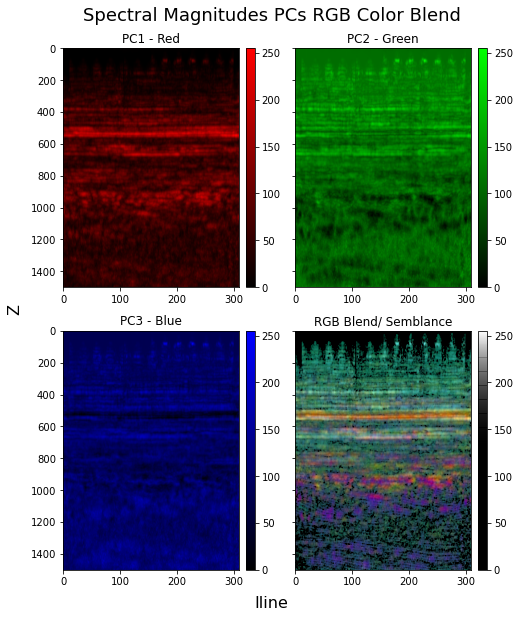

In [112]:
# view RGB principal components blend
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(7,8), sharey=True)
cmap_r = LinearSegmentedColormap.from_list(name='r', colors=[(0,0,0,1), (1,0,0,1)])
cmap_g = LinearSegmentedColormap.from_list(name='g', colors=[(0,0,0,1), (0,1,0,1)])
cmap_b = LinearSegmentedColormap.from_list(name='b', colors=[(0,0,0,1), (0,0,1,1)])
cmap_a = LinearSegmentedColormap.from_list(name='a', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,0)])
for i, ax in enumerate(fig.axes):
    if i == 0: 
        im = ax.imshow(PC_mp_spec_m_2D_lst_gray[0].T, cmap=cmap_r, aspect='auto', vmin=0, vmax=255)
        ax.set_title('%s' %PC_titles[i] + ' - Red', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 1: 
        im = ax.imshow(PC_mp_spec_m_2D_lst_gray[1].T, cmap=cmap_g, aspect='auto', vmin=0, vmax=255)
        ax.set_title('%s' %PC_titles[i] + ' - Green', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 2: 
        im = ax.imshow(PC_mp_spec_m_2D_lst_gray[2].T, cmap=cmap_b, aspect='auto', vmin=0, vmax=255)
        ax.set_title('%s' %PC_titles[i] + ' - Blue', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    else:
        im = ax.imshow(PC_mp_spec_m_2D_stack.transpose(1,0,2), aspect='auto', vmin=0, vmax=255)
        ax.set_title('RGB Blend/ Semblance', size=12)
        im2 = ax.imshow(sembl_based_coh_2D_gray.T, cmap=cmap_a, aspect='auto', vmin=0, vmax=255)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im2, cax=cax, ax=ax, orientation='vertical')
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Magnitudes PCs RGB Color Blend', ha='center', va='center', size=18)
plt.tight_layout()

#### Peak Component 2D (Spectral Voice)

In [113]:
# extract peak spectral voice
peak_spec_v_2D = spec_voice_2D[peak_spec_comp_2D-1,:,:]

In [114]:
# compute peak spectral voice complex trace attributes
peak_spec_v_trace_attributes_2D = traces_2D(peak_spec_v_2D, dt)

# compute peak spectral voice edge detection attributes
peak_spec_v_edge_attributes_2D = edges_2D(peak_spec_v_2D, zwin=None, window=(3,9))

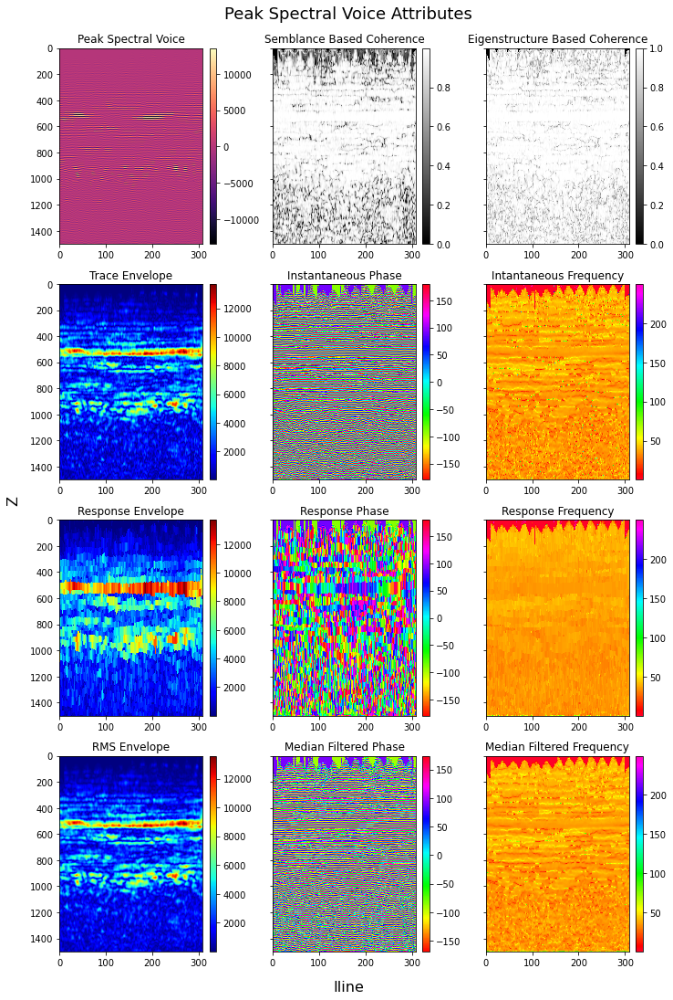

In [115]:
# view peak spectral voice attributes
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10,14.5), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(peak_spec_v_2D.T, shading='auto', cmap='magma', 
                              vmin=np.percentile(peak_spec_v_2D, 0), 
                              vmax=np.percentile(peak_spec_v_2D, 100))
        ax.set_title('Peak Spectral Voice', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i in [1,2]:
        im[i] = ax.pcolormesh(peak_spec_v_edge_attributes_2D[i-1].T, shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(peak_spec_v_edge_attributes_2D[i-1], 0), 
                              vmax=np.percentile(peak_spec_v_edge_attributes_2D[i-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(peak_spec_v_trace_attributes_2D[i-3].T, shading='auto', cmap=trace_cmaps[i-3], 
                              vmin=np.percentile(peak_spec_v_trace_attributes_2D[i-3], 0), 
                              vmax=np.percentile(peak_spec_v_trace_attributes_2D[i-3], 100))
        ax.set_title(trace_titles[i-3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Voice Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### Peak Component 2D (Spectral Magnitude)

In [116]:
# extract peak spectral magnitude
peak_spec_m_2D = spec_mag_2D[peak_spec_comp_2D-1,:,:]

In [117]:
# compute peak spectral magnitude complex trace attributes
peak_spec_m_trace_attributes_2D = traces_2D(peak_spec_m_2D, dt)

# compute peak spectral magnitude edge detection attributes
peak_spec_m_edge_attributes_2D = edges_2D(peak_spec_m_2D, zwin=None, window=(3,9))

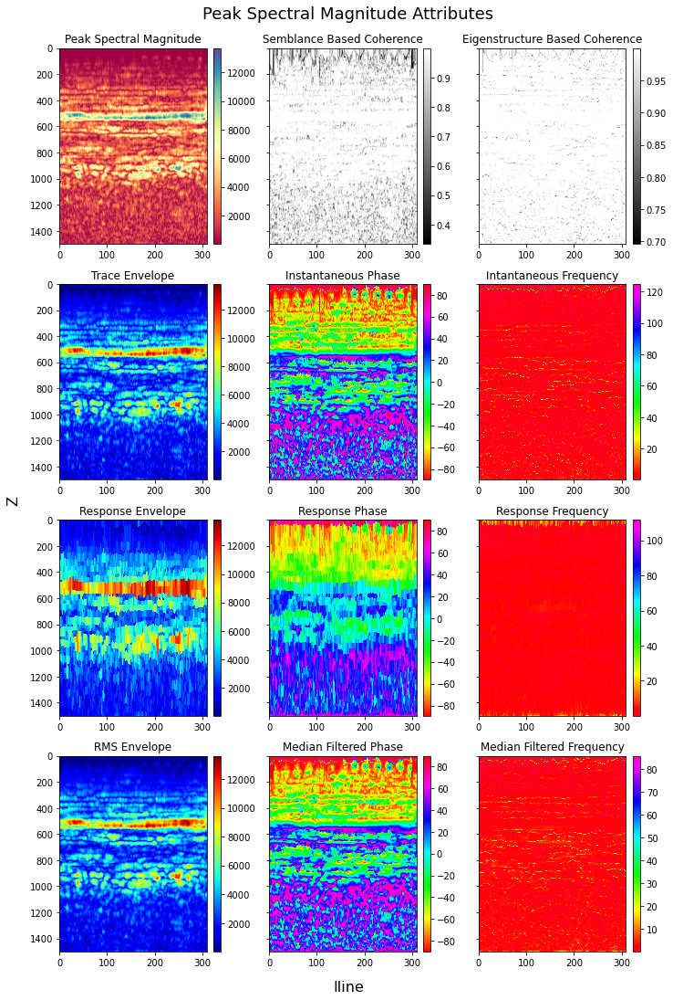

In [118]:
# view peak spectral magnitude attributes
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(10,14.5), sharey=True, constrained_layout=False)
im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(peak_spec_m_2D.T, shading='auto', cmap='Spectral', 
                              vmin=np.percentile(peak_spec_m_2D, 0), 
                              vmax=np.percentile(peak_spec_m_2D, 100))
        ax.set_title('Peak Spectral Magnitude', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i in [1,2]:
        im[i] = ax.pcolormesh(peak_spec_m_edge_attributes_2D[i-1].T, shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(peak_spec_m_edge_attributes_2D[i-1], 0), 
                              vmax=np.percentile(peak_spec_m_edge_attributes_2D[i-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    else:
        im[i] = ax.pcolormesh(peak_spec_m_trace_attributes_2D[i-3].T, shading='auto', cmap=trace_cmaps[i-3], 
                              vmin=np.percentile(peak_spec_m_trace_attributes_2D[i-3], 0), 
                              vmax=np.percentile(peak_spec_m_trace_attributes_2D[i-3], 100))
        ax.set_title(trace_titles[i-3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
ax.invert_yaxis()
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Magnitude Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### HSL Corendering 2D

Hue - Peak Spectral Phase/Frequency: H = P or F

Saturation - Peak Spectral Magnitude: S = 100 * (M / M_max)

Lightness - Crosscorrelation Based Coherence: L = (C * L_min) + ((1 - C) * L_max)

where:

P = phase

F = frequency

M = magnitude

M_max = maximum magnitude

C = coherence

L_min = threshold minimum coherence

L_max = threshold maximum coherence

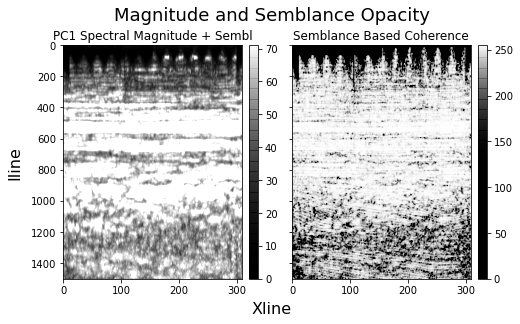

In [119]:
# set opacity range for magnitude and semblance
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,0)])

im1 = ax[0].imshow(PC_mp_spec_m_2D_lst_gray[0].T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].set_title('PC1 Spectral Magnitude + Sembl', size=12)
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=255)
ax[1].set_title('Semblance Based Coherence', size=12)
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)

fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Magnitude and Semblance Opacity', ha='center', va='center', size=18)
plt.tight_layout()

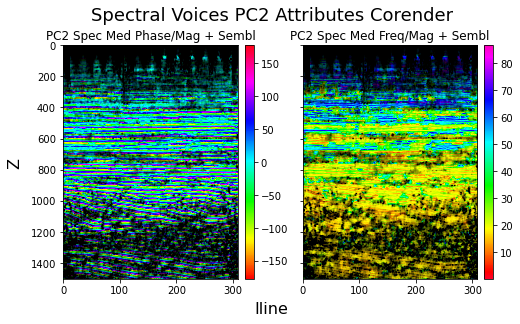

In [120]:
# corender spectral voices PC1 attributes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(PC2_mp_spec_v_trace_attributes_2D[7].T, cmap='hsv', aspect='auto')
ax[0].imshow(PC_mp_spec_m_2D_lst_gray[0].T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[0].set_title('PC2 Spec Med Phase/Mag + Sembl', size=12)
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(PC2_mp_spec_v_trace_attributes_2D[8].T, cmap='gist_rainbow', aspect='auto', 
                   vmin=np.percentile(PC2_mp_spec_v_trace_attributes_2D[8], 1), 
                   vmax=np.percentile(PC2_mp_spec_v_trace_attributes_2D[8], 99))
ax[1].imshow(PC_mp_spec_m_2D_lst_gray[0].T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[1].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('PC2 Spec Med Freq/Mag + Sembl', size=12)
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)
    
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Voices PC2 Attributes Corender', ha='center', va='center', size=18)
plt.tight_layout()

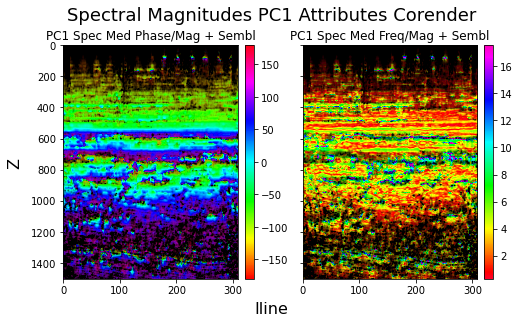

In [121]:
# corender spectral magnitudes PC1 attributes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(PC1_mp_spec_m_trace_attributes_2D[7].T, cmap='hsv', aspect='auto')
ax[0].imshow(PC_mp_spec_m_2D_lst_gray[0].T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[0].set_title('PC1 Spec Med Phase/Mag + Sembl', size=12)
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(PC1_mp_spec_m_trace_attributes_2D[8].T, cmap='gist_rainbow', aspect='auto', 
                   vmin=np.percentile(PC1_mp_spec_m_trace_attributes_2D[8], 1), 
                   vmax=np.percentile(PC1_mp_spec_m_trace_attributes_2D[8], 99))
ax[1].imshow(PC_mp_spec_m_2D_lst_gray[0].T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[1].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('PC1 Spec Med Freq/Mag + Sembl', size=12)
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)
    
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Magnitudes PC1 Attributes Corender', ha='center', va='center', size=18)
plt.tight_layout()

In [122]:
# convert to grayscale
peak_spec_m_2D_gray = grayscale(peak_spec_m_2D, np.min(peak_spec_m_2D), np.max(peak_spec_m_2D))

# convert to 8-bit unsigned integer
peak_spec_m_2D_gray = np.uint8(peak_spec_m_2D_gray)

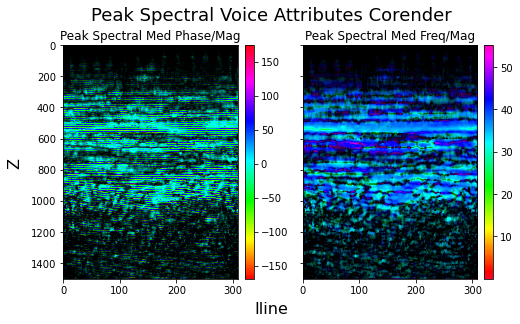

In [123]:
# corender peak spectral voice attributes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(peak_spec_v_trace_attributes_2D[7].T, cmap='hsv', aspect='auto')
ax[0].imshow(peak_spec_m_2D_gray.T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[0].set_title('Peak Spectral Med Phase/Mag', size=12)
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(peak_spec_v_trace_attributes_2D[8].T, cmap='gist_rainbow', aspect='auto', 
                   vmin=np.percentile(peak_spec_v_trace_attributes_2D[8], 1), 
                   vmax=np.percentile(peak_spec_v_trace_attributes_2D[8], 99))
ax[1].imshow(peak_spec_m_2D_gray.T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[1].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('Peak Spectral Med Freq/Mag', size=12)
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)
    
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Voice Attributes Corender', ha='center', va='center', size=18)
plt.tight_layout()

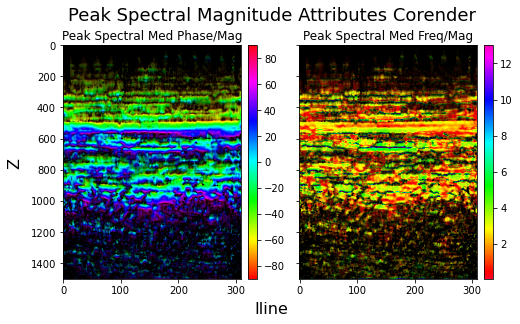

In [124]:
# corender peak spectral magnitude attributes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(peak_spec_m_trace_attributes_2D[7].T, cmap='hsv', aspect='auto')
ax[0].imshow(peak_spec_m_2D_gray.T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[0].set_title('Peak Spectral Med Phase/Mag', size=12)
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(peak_spec_m_trace_attributes_2D[8].T, cmap='gist_rainbow', aspect='auto', 
                   vmin=np.percentile(peak_spec_m_trace_attributes_2D[8], 1), 
                   vmax=np.percentile(peak_spec_m_trace_attributes_2D[8], 99))
ax[1].imshow(peak_spec_m_2D_gray.T, cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[1].imshow(sembl_based_coh_2D_gray.T, cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('Peak Spectral Med Freq/Mag', size=12)
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)
    
fig.text(0.5,-0.01, 'Iline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Z', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Magnitude Attributes Corender', ha='center', va='center', size=18)
plt.tight_layout()

### 3D Continuous Wavelet Transform (CWT)

#### Seismic Attributes 3D

In [125]:
# create complex trace attributes function
def traces_3D(real, dt):
    
    # signal components
    R_trace = real
    C_trace = hilbert(R_trace, axis=-1)
    I_trace = np.imag(C_trace)
        
    # instantaneous attributes
    env = np.abs(C_trace)  # envelope
    phase = np.rad2deg(np.angle(C_trace))  # phase
    freq = np.abs((1/(2*np.pi))*(np.gradient(np.unwrap(np.deg2rad(phase)), dt, axis=-1)))  # frequency
    
    # rac = np.gradient(env, dt, axis=-1)/env  # relative amplitude change
    # band = (1/(2*np.pi))*np.abs(rac)  # instantaneous bandwidth
    # dom_freq = np.hypot(freq, band)  # dominant frequency
    # sweet = env/np.sqrt(dom_freq)  # sweetness
    
    def rms(real):
        rms = np.sqrt(np.mean(real**2))
        return rms
    
    rms_env = ndimage.generic_filter(env, rms, size=(3,3,3), mode='reflect')  # root mean square envelope
    med_phase = ndimage.median_filter(phase, size=(3,3,3), mode='reflect')  # median filtered phase
    med_freq = ndimage.median_filter(freq, size=(3,3,3), mode='reflect')  # median filtered frequency
    
    # create a boolean array of trough locations
    troughs_idx = argrelmin(env, axis=-1, order=1, mode='clip')
    troughs = np.zeros(env.shape, dtype=bool)
    troughs[troughs_idx] = True
    troughs = np.cumsum(troughs, axis=-1)
    
    # def response(envelope, real, phase, freq, troughs):
        # # response attributes
        # resp_env = np.zeros(envelope.shape)
        # resp_phase = np.zeros(envelope.shape)
        # resp_freq = np.zeros(envelope.shape)
        # app_pol = np.zeros(envelope.shape)
        
        # for i in np.ndindex(envelope.shape[:-1]):
            # # unique classes (True or False)
            # ints = np.unique(troughs[i, j, :])
            
            # for ii in ints:
                # idx = np.where(troughs[i, j, :] == ii)[-1]
                # peak = idx[envelope[i, j, idx].argmax()]
                
                # resp_env[i, j, idx] = envelope[i, j, peak]  # response envelope
                # resp_phase[i, j, idx] = phase[i, j, peak]  # response phase
                # resp_freq[i, j, idx] = freq[i, j, peak]  # response frequency
                # app_pol[i, j, idx] = envelope[i, j, peak] * np.sign(real[i, j, peak]) # apparent polarity
                
        # return resp_env, resp_phase, resp_freq, app_pol
    
    # resp_env, resp_phase, resp_freq, app_pol = response(env, R_trace, phase, freq, troughs)
    
    return rms_env, med_phase, med_freq

In [126]:
# create edge detection attributes function
def edges_3D(data, zwin, window):
    
    # # crosscorrelation based coherence
    # corr_coh_2D = np.zeros_like(data)
    # nx, ny, nz = data.shape
    # # pad data by reflecting boundary
    # padded = np.pad(data, ((0, 1), (0, 1), (zwin//2, zwin//2)), mode='reflect')
    
    # for x, y, z, in np.ndindex(nx, ny, nz):
        # center_trace = data[x, y, :]  # center trace (full length of time axis)   
        # x_trace = padded[x+1, y, z:z+zwin]  # adjacent traces (moving window along time axis)
        # y_trace = padded[x, y+1, z:z+zwin]  # adjacent traces (moving window along time axis)
        # # cross correlate (output length = center_trace.size - x_trace.size + 1)
        # xcorr = np.correlate(center_trace, x_trace)
        # ycorr = np.correlate(center_trace, y_trace)
        # # maximum normalized cross correlation value
        # center_std = center_trace.std()
        # x_std = x_trace.std()
        # y_std = y_trace.std()
        # px = xcorr.max() / (xcorr.size * center_std * x_std)
        # py = ycorr.max() / (ycorr.size * center_std * y_std)
        # corr_coh_2D[x,y,z] = np.sqrt(px**2 + py**2)  # normalized crosscorrelation based coherence

    # corr_coh_2D = np.clip(corr_coh_2D, a_min=0, a_max=1)
    # corr_coh_2D = np.nan_to_num(corr_coh_2D, nan=0, posinf=1, neginf=0)
    
    # semblance based coherence
    def sembl_func(region):
        # reshape 1D generic filter input to window shape
        region = region.reshape(window)
        # reshape window to 2D array (ntraces by nsamples)
        region = region.reshape(-1, region.shape[-1])
        ntraces, nsamples = region.shape
        
        # in terms of energy ratio
        square_of_sums = np.sum(region, axis=0)**2
        sum_of_squares = np.sum(region**2, axis=0)
        sembl = square_of_sums.sum() / sum_of_squares.sum()
        
        # alternatively in terms of covariance matrix
        # cov = region.dot(region.T)
        # sembl = cov.sum() / cov.diagonal().sum()
        
        return sembl / ntraces
    
    # semblance is sensitive to amplitude and phase changes (better for stratigraphy)
    sembl_coh = ndimage.generic_filter(data, sembl_func, window)  # semblance based coherence
    sembl_coh[np.isnan(sembl_coh)] = 0
        
    # def eigenstruc_func(region):
        # # reshape 1D generic filter input to window shape
        # region = region.reshape(window)
        # # reshape window to 2D array (ntraces by nsamples)
        # region = region.reshape(-1, region.shape[-1])
        
        # # ratio of the largest eigenvalue to sum of eigenvalues
        # cov = region.dot(region.T)
        # vals = np.linalg.eigvalsh(cov)
        # eigenstruc = vals.max() / vals.sum()
        
        # return eigenstruc
    
    # # eigenstructure is sensitive only to phase changes (better for subtle structures)
    # eigenstruc_coh = ndimage.generic_filter(data, eigenstruc_func, window)  # eigenstructure based coherence
    # eigenstruc_coh[np.isnan(eigenstruc_coh)] = 0
    
    # # gradient magnitude
    # gauss_gdmg = ndimage.gaussian_gradient_magnitude(data, sigma=(1,1,1), mode='reflect')  
    # gauss_gdmg = gauss_gdmg/np.max(gauss_gdmg)  # normalized gaussian gradient magnitude
    
    return sembl_coh

In [127]:
# compute complex trace attributes
trace_attributes_3D = traces_3D(sub_signal_3D, dt)

# compute edge detection attributes
edge_attributes_3D = edges_3D(sub_signal_3D, zwin=None, window=(3,3,9))

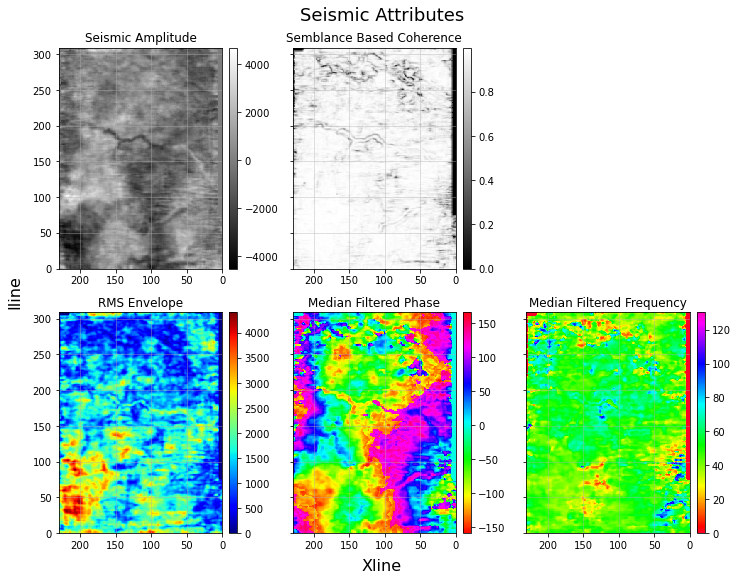

In [128]:
# view seismic attributes
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10,7.5), sharey=True, constrained_layout=False)
z_sel = 22  # twt 842ms

im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(sub_signal_3D[:,:,z_sel-1], shading='auto', cmap='gray', 
                              vmin=np.percentile(sub_signal_3D[:,:,z_sel-1], 0), 
                              vmax=np.percentile(sub_signal_3D[:,:,z_sel-1], 100))
        ax.set_title('Seismic Amplitude', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i == 1:
        im[i] = ax.pcolormesh(edge_attributes_3D[:,:,z_sel-1], shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(edge_attributes_3D[:,:,z_sel-1], 0), 
                              vmax=np.percentile(edge_attributes_3D[:,:,z_sel-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i == 2:
        ax.set_axis_off()
    else:
        im[i] = ax.pcolormesh(trace_attributes_3D[i-3][:,:,z_sel-1], shading='auto', cmap=trace_cmaps[i+3], 
                              vmin=np.percentile(trace_attributes_3D[i-3][:,:,z_sel-1], 0), 
                              vmax=np.percentile(trace_attributes_3D[i-3][:,:,z_sel-1], 100))
        ax.set_title(trace_titles[i+3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    ax.grid(alpha=0.5)
    ax.invert_xaxis()
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Seismic Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### Peak Spectral Component 3D

In [129]:
# extract CWT peak wavelet coefficient
peak_coef_3D, peak_frequency_3D = pywt.cwt(sub_signal_3D, scales=peak_scale_3D, wavelet='morl', sampling_period=0.002, axis=-1)

In [130]:
peak_coef_3D.shape, peak_frequency_3D.size

((1, 309, 230, 51), 1)

In [131]:
# spectral voice (real component of the complex transform)
peak_spec_v_3D = peak_coef_3D

# spectral magnitude (root of the squares of the real and imaginary components)
peak_spec_m_3D = np.abs(hilbert(peak_coef_3D, axis=-1))

In [132]:
peak_spec_v_3D = peak_spec_v_3D.reshape(sub_signal_3D.shape)
peak_spec_m_3D = peak_spec_m_3D.reshape(sub_signal_3D.shape)

#### Peak Component 3D (Spectral Voice)

In [133]:
# compute peak spectral voice complex trace attributes
peak_spec_v_trace_attributes_3D = traces_3D(peak_spec_v_3D, dt)

# compute peak spectral voice edge detection attributes
peak_spec_v_edge_attributes_3D = edges_3D(peak_spec_v_3D, zwin=None, window=(3,3,9))

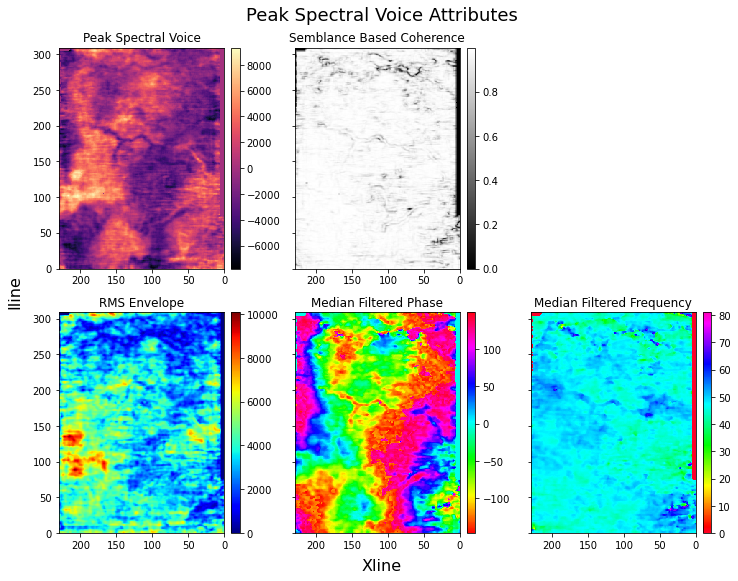

In [134]:
# view peak spectral voice attributes
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10,7.5), sharey=True, constrained_layout=False)
z_sel = 22  # twt 842ms

im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(peak_spec_v_3D[:,:,z_sel-1], shading='auto', cmap='magma', 
                              vmin=np.percentile(peak_spec_v_3D[:,:,z_sel-1], 0), 
                              vmax=np.percentile(peak_spec_v_3D[:,:,z_sel-1], 100))
        ax.set_title('Peak Spectral Voice', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i == 1:
        im[i] = ax.pcolormesh(peak_spec_v_edge_attributes_3D[:,:,z_sel-1], shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(peak_spec_v_edge_attributes_3D[:,:,z_sel-1], 0), 
                              vmax=np.percentile(peak_spec_v_edge_attributes_3D[:,:,z_sel-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i == 2:
        ax.set_axis_off()
    else:
        im[i] = ax.pcolormesh(peak_spec_v_trace_attributes_3D[i-3][:,:,z_sel-1], shading='auto', cmap=trace_cmaps[i+3], 
                              vmin=np.percentile(peak_spec_v_trace_attributes_3D[i-3][:,:,z_sel-1], 0), 
                              vmax=np.percentile(peak_spec_v_trace_attributes_3D[i-3][:,:,z_sel-1], 100))
        ax.set_title(trace_titles[i+3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    ax.invert_xaxis()
    ax.invert_yaxis()
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Voice Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### Peak Component 3D (Spectral Magnitude)

In [135]:
# compute peak spectral magnitude complex trace attributes
peak_spec_m_trace_attributes_3D = traces_3D(peak_spec_m_3D, dt)

# compute peak spectral magnitude edge detection attributes
peak_spec_m_edge_attributes_3D = edges_3D(peak_spec_m_3D, zwin=None, window=(3,3,9))

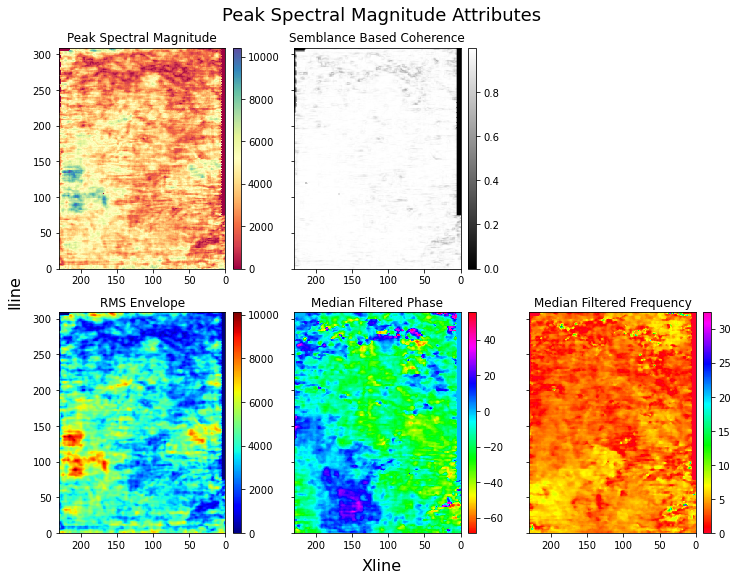

In [136]:
# view peak spectral magnitude attributes
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10,7.5), sharey=True, constrained_layout=False)
z_sel = 22  # twt 842ms

im = [i for i in enumerate(fig.axes)]
for i, ax in enumerate(fig.axes):
    if i == 0:
        im[i] = ax.pcolormesh(peak_spec_m_3D[:,:,z_sel-1], shading='auto', cmap='Spectral', 
                              vmin=np.percentile(peak_spec_m_3D[:,:,z_sel-1], 0), 
                              vmax=np.percentile(peak_spec_m_3D[:,:,z_sel-1], 100))
        ax.set_title('Peak Spectral Magnitude', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i == 1:
        im[i] = ax.pcolormesh(peak_spec_m_edge_attributes_3D[:,:,z_sel-1], shading='auto', cmap=edge_cmaps[i-1], 
                              vmin=np.percentile(peak_spec_m_edge_attributes_3D[:,:,z_sel-1], 0), 
                              vmax=np.percentile(peak_spec_m_edge_attributes_3D[:,:,z_sel-1], 100))
        ax.set_title(edge_titles[i-1], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    elif i == 2:
        ax.set_axis_off()
    else:
        im[i] = ax.pcolormesh(peak_spec_m_trace_attributes_3D[i-3][:,:,z_sel-1], shading='auto', cmap=trace_cmaps[i+3], 
                              vmin=np.percentile(peak_spec_m_trace_attributes_3D[i-3][:,:,z_sel-1], 0), 
                              vmax=np.percentile(peak_spec_m_trace_attributes_3D[i-3][:,:,z_sel-1], 100))
        ax.set_title(trace_titles[i+3], size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im[i], cax=cax, ax=ax)
    ax.invert_xaxis()
    ax.invert_yaxis()
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Magnitude Attributes', ha='center', va='center', size=18)
plt.tight_layout()

#### Low/High Spectral Component 3D

In [137]:
# extract CWT low (12Hz) wavelet coefficient
low_coef_3D, low_frequency_3D = pywt.cwt(sub_signal_3D, scales=low_scale_3D, wavelet='morl', sampling_period=0.002, axis=-1)

# extract CWT high (86Hz) wavelet coefficient
high_coef_3D, high_frequency_3D = pywt.cwt(sub_signal_3D, scales=high_scale_3D, wavelet='morl', sampling_period=0.002, axis=-1)

In [138]:
low_coef_3D.shape, high_coef_3D.shape, low_frequency_3D.size, high_frequency_3D.size

((1, 309, 230, 51), (1, 309, 230, 51), 1, 1)

In [139]:
# spectral voice (real component of the complex transform)
low_spec_v_3D = low_coef_3D
high_spec_v_3D = high_coef_3D

# spectral magnitude (root of the squares of the real and imaginary components)
low_spec_m_3D = np.abs(hilbert(low_coef_3D, axis=-1))
high_spec_m_3D = np.abs(hilbert(high_coef_3D, axis=-1))

In [140]:
low_spec_v_3D = low_spec_v_3D.reshape(sub_signal_3D.shape)
high_spec_v_3D = high_spec_v_3D.reshape(sub_signal_3D.shape)

low_spec_m_3D = low_spec_m_3D.reshape(sub_signal_3D.shape)
high_spec_m_3D = high_spec_m_3D.reshape(sub_signal_3D.shape)

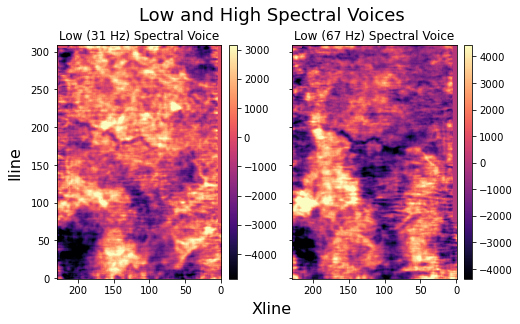

In [141]:
# view low and high spectral voices
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
im1 = ax[0].imshow(low_spec_v_3D[:,:,z_sel-1], cmap='magma', aspect='auto', 
                   vmin=np.percentile(low_spec_v_3D[:,:,z_sel-1], 1), 
                   vmax=np.percentile(low_spec_v_3D[:,:,z_sel-1], 99))
ax[0].set_title('Low (31 Hz) Spectral Voice', size=12)
ax[0].invert_xaxis()
ax[0].invert_yaxis()
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(high_spec_v_3D[:,:,z_sel-1], cmap='magma', aspect='auto', 
                   vmin=np.percentile(high_spec_v_3D[:,:,z_sel-1], 1), 
                   vmax=np.percentile(high_spec_v_3D[:,:,z_sel-1], 99))
ax[1].set_title('Low (67 Hz) Spectral Voice', size=12)
ax[1].invert_xaxis()
ax[1].invert_yaxis()
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)

fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Low and High Spectral Voices', ha='center', va='center', size=18)
plt.tight_layout()

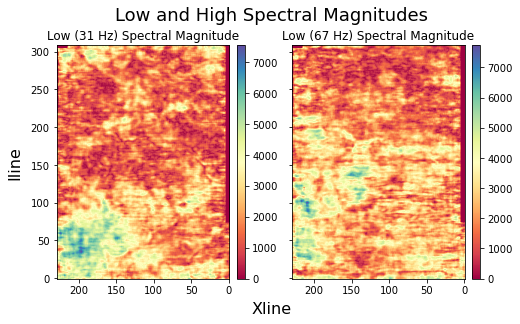

In [142]:
# view low and high spectral magnitudes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
im1 = ax[0].imshow(low_spec_m_3D[:,:,z_sel-1], cmap='Spectral', aspect='auto', 
                   vmin=np.percentile(low_spec_m_3D[:,:,z_sel-1], 0), 
                   vmax=np.percentile(low_spec_m_3D[:,:,z_sel-1], 100))
ax[0].set_title('Low (31 Hz) Spectral Magnitude', size=12)
ax[0].invert_xaxis()
ax[0].invert_yaxis()
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(high_spec_m_3D[:,:,z_sel-1], cmap='Spectral', aspect='auto', 
                   vmin=np.percentile(high_spec_m_3D[:,:,z_sel-1], 0), 
                   vmax=np.percentile(high_spec_m_3D[:,:,z_sel-1], 100))
ax[1].set_title('Low (67 Hz) Spectral Magnitude', size=12)
ax[1].invert_xaxis()
ax[1].invert_yaxis()
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)

fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Low and High Spectral Magnitudes', ha='center', va='center', size=18)
plt.tight_layout()

#### RGBA Color Blending 3D

In [143]:
# check scale and data type
np.min(peak_spec_v_3D), np.max(peak_spec_v_3D), peak_spec_v_3D.dtype

(-9941.541, 10319.914, dtype('float32'))

In [144]:
# convert to grayscale
low_spec_v_3D_gray = grayscale(low_spec_v_3D, np.min(low_spec_v_3D), np.max(low_spec_v_3D))
peak_spec_v_3D_gray = grayscale(peak_spec_v_3D, np.min(peak_spec_v_3D), np.max(peak_spec_v_3D))
high_spec_v_3D_gray = grayscale(high_spec_v_3D, np.min(high_spec_v_3D), np.max(high_spec_v_3D))
sembl_based_coh_3D_gray = grayscale(edge_attributes_3D, np.min(edge_attributes_3D), np.max(edge_attributes_3D))

# convert to 8-bit unsigned integer
low_spec_v_3D_gray = np.uint8(low_spec_v_3D_gray)
peak_spec_v_3D_gray = np.uint8(peak_spec_v_3D_gray)
high_spec_v_3D_gray = np.uint8(high_spec_v_3D_gray)
sembl_based_coh_3D_gray = np.uint8(sembl_based_coh_3D_gray)

In [145]:
# check new scale and data type
np.min(peak_spec_v_3D_gray), np.max(peak_spec_v_3D_gray), peak_spec_v_3D_gray.dtype

(0, 255, dtype('uint8'))

In [146]:
# stack spectral components in RGB channels
RGB_v_3D_stack = np.stack([low_spec_v_3D_gray, peak_spec_v_3D_gray, high_spec_v_3D_gray])

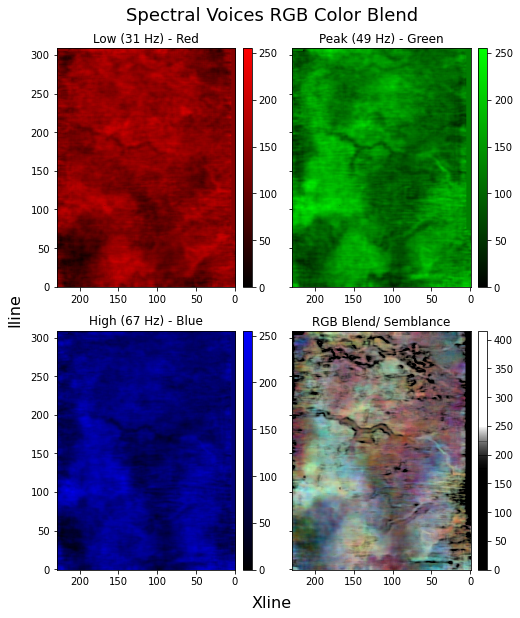

In [147]:
# view RGB principal components blend
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(7,8), sharey=True)
z_sel = 22  # twt 842ms

cmap_r = LinearSegmentedColormap.from_list(name='r', colors=[(0,0,0,1), (1,0,0,1)])
cmap_g = LinearSegmentedColormap.from_list(name='g', colors=[(0,0,0,1), (0,1,0,1)])
cmap_b = LinearSegmentedColormap.from_list(name='b', colors=[(0,0,0,1), (0,0,1,1)])
cmap_a = LinearSegmentedColormap.from_list(name='a', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

for i, ax in enumerate(fig.axes):
    if i == 0: 
        im = ax.imshow(low_spec_v_3D_gray[:,:,z_sel-1], cmap=cmap_r, aspect='auto', vmin=0, vmax=255)
        ax.set_title('Low (31 Hz) - Red', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 1: 
        im = ax.imshow(peak_spec_v_3D_gray[:,:,z_sel-1], cmap=cmap_g, aspect='auto', vmin=0, vmax=255)
        ax.set_title('Peak (49 Hz) - Green', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 2: 
        im = ax.imshow(high_spec_v_3D_gray[:,:,z_sel-1], cmap=cmap_b, aspect='auto', vmin=0, vmax=255)
        ax.set_title('High (67 Hz) - Blue', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    else:
        im = ax.imshow(RGB_v_3D_stack.transpose(1,2,3,0)[:,:,z_sel-1,:], aspect='auto', vmin=0, vmax=255)
        ax.set_title('RGB Blend/ Semblance', size=12)
        im2 = ax.imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_a, aspect='auto', vmin=0, vmax=415)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im2, cax=cax, ax=ax, orientation='vertical')
    ax.invert_xaxis()
    ax.invert_yaxis()
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Voices RGB Color Blend', ha='center', va='center', size=18)
plt.tight_layout()

In [148]:
# check scale and data type
np.min(peak_spec_m_3D), np.max(peak_spec_m_3D), peak_spec_m_3D.dtype

(0.0, 10533.462744855276, dtype('float64'))

In [149]:
# convert to grayscale
low_spec_m_3D_gray = grayscale(low_spec_m_3D, np.min(low_spec_m_3D), np.max(low_spec_m_3D))
peak_spec_m_3D_gray = grayscale(peak_spec_m_3D, np.min(peak_spec_m_3D), np.max(peak_spec_m_3D))
high_spec_m_3D_gray = grayscale(high_spec_m_3D, np.min(high_spec_m_3D), np.max(high_spec_m_3D))
sembl_based_coh_3D_gray = grayscale(edge_attributes_3D, np.min(edge_attributes_3D), np.max(edge_attributes_3D))

# convert to 8-bit unsigned integer
low_spec_m_3D_gray = np.uint8(low_spec_m_3D_gray)
peak_spec_m_3D_gray = np.uint8(peak_spec_m_3D_gray)
high_spec_m_3D_gray = np.uint8(high_spec_m_3D_gray)
sembl_based_coh_3D_gray = np.uint8(sembl_based_coh_3D_gray)

In [150]:
# check new scale and data type
np.min(peak_spec_m_3D_gray), np.max(peak_spec_m_3D_gray), peak_spec_m_3D_gray.dtype

(0, 255, dtype('uint8'))

In [151]:
# stack spectral components in RGB channels
RGB_m_3D_stack = np.stack([low_spec_m_3D_gray, peak_spec_m_3D_gray, high_spec_m_3D_gray])

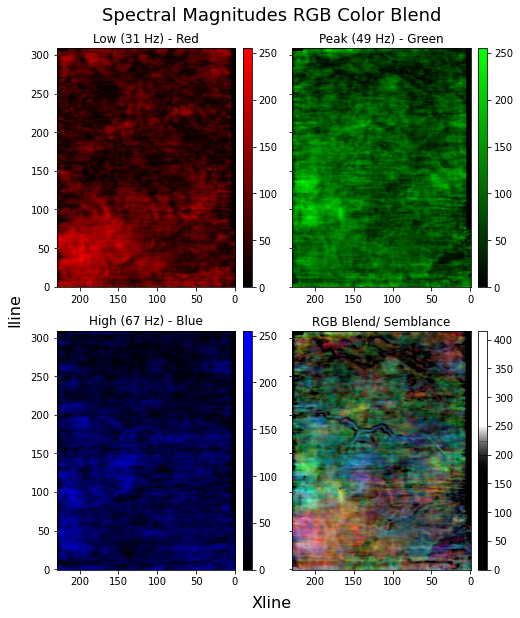

In [152]:
# view RGB principal components blend
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(7,8), sharey=True)
z_sel = 22  # twt 842ms

cmap_r = LinearSegmentedColormap.from_list(name='r', colors=[(0,0,0,1), (1,0,0,1)])
cmap_g = LinearSegmentedColormap.from_list(name='g', colors=[(0,0,0,1), (0,1,0,1)])
cmap_b = LinearSegmentedColormap.from_list(name='b', colors=[(0,0,0,1), (0,0,1,1)])
cmap_a = LinearSegmentedColormap.from_list(name='a', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

for i, ax in enumerate(fig.axes):
    if i == 0: 
        im = ax.imshow(low_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_r, aspect='auto', vmin=0, vmax=255)
        ax.set_title('Low (31 Hz) - Red', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 1: 
        im = ax.imshow(peak_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_g, aspect='auto', vmin=0, vmax=255)
        ax.set_title('Peak (49 Hz) - Green', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    elif i == 2: 
        im = ax.imshow(high_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_b, aspect='auto', vmin=0, vmax=255)
        ax.set_title('High (67 Hz) - Blue', size=12)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im, cax=cax, ax=ax, orientation='vertical')
    else:
        im = ax.imshow(RGB_m_3D_stack.transpose(1,2,3,0)[:,:,z_sel-1,:], aspect='auto', vmin=0, vmax=255)
        ax.set_title('RGB Blend/ Semblance', size=12)
        im2 = ax.imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_a, aspect='auto', vmin=0, vmax=415)
        cax = make_axes_locatable(ax).append_axes('right', size='5%', pad=0.1)
        fig.colorbar(im2, cax=cax, ax=ax, orientation='vertical')
    ax.invert_xaxis()
    ax.invert_yaxis()
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Spectral Magnitudes RGB Color Blend', ha='center', va='center', size=18)
plt.tight_layout()

#### HSL Corendering 3D

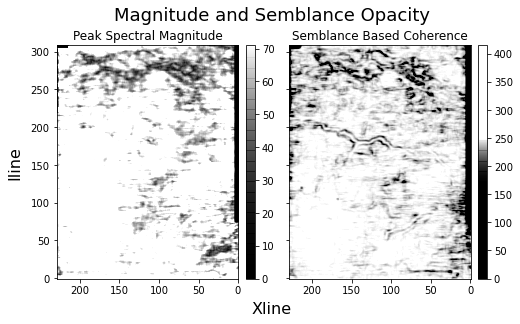

In [153]:
# set opacity range for magnitude and semblance
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(peak_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].set_title('Peak Spectral Magnitude', size=12)
ax[0].invert_xaxis()
ax[0].invert_yaxis()
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('Semblance Based Coherence', size=12)
ax[1].invert_xaxis()
ax[1].invert_yaxis()
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)

fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Magnitude and Semblance Opacity', ha='center', va='center', size=18)
plt.tight_layout()

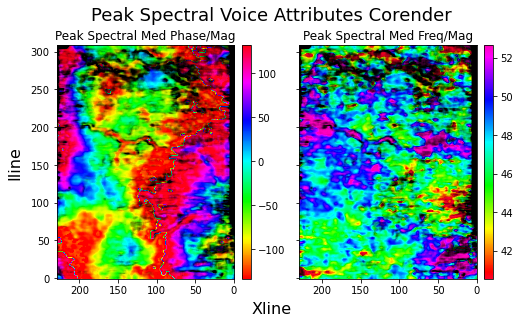

In [154]:
# corender peak spectral voice attributes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(peak_spec_v_trace_attributes_3D[-2][:,:,z_sel-1], cmap='hsv', aspect='auto', 
                   vmin=np.percentile(peak_spec_v_trace_attributes_3D[-2][:,:,z_sel-1], 5), 
                   vmax=np.percentile(peak_spec_v_trace_attributes_3D[-2][:,:,z_sel-1], 95))
ax[0].imshow(peak_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[0].set_title('Peak Spectral Med Phase/Mag', size=12)
ax[0].invert_xaxis()
ax[0].invert_yaxis()
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(peak_spec_v_trace_attributes_3D[-1][:,:,z_sel-1], cmap='gist_rainbow', aspect='auto', 
                   vmin=np.percentile(peak_spec_v_trace_attributes_3D[-1][:,:,z_sel-1], 5), 
                   vmax=np.percentile(peak_spec_v_trace_attributes_3D[-1][:,:,z_sel-1], 95))
ax[1].imshow(peak_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[1].imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('Peak Spectral Med Freq/Mag', size=12)
ax[1].invert_xaxis()
ax[1].invert_yaxis()
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)
    
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Voice Attributes Corender', ha='center', va='center', size=18)
plt.tight_layout()

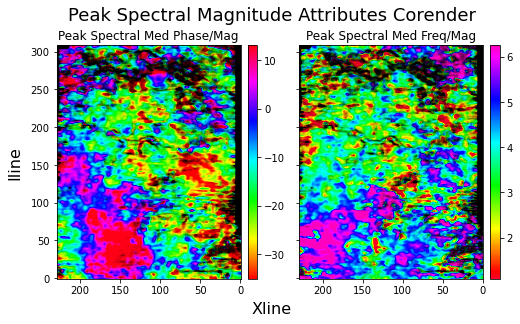

In [155]:
# corender peak spectral magnitude attributes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7,4), sharey=True)
cmap_m = LinearSegmentedColormap.from_list(name='m', colors=[(0,0,0,1), (0,0,0,0)])
cmap_l = LinearSegmentedColormap.from_list(name='l', colors=[(0,0,0,1), (0,0,0,1), (0,0,0,1), 
                                                             (0,0,0,0), (0,0,0,0), (0,0,0,0)])

im1 = ax[0].imshow(peak_spec_m_trace_attributes_3D[-2][:,:,z_sel-1], cmap='hsv', aspect='auto', 
                   vmin=np.percentile(peak_spec_m_trace_attributes_3D[-2][:,:,z_sel-1], 5), 
                   vmax=np.percentile(peak_spec_m_trace_attributes_3D[-2][:,:,z_sel-1], 95))
ax[0].imshow(peak_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[0].imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[0].set_title('Peak Spectral Med Phase/Mag', size=12)
ax[0].invert_xaxis()
ax[0].invert_yaxis()
cax = make_axes_locatable(ax[0]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im1, cax=cax, ax=ax)

im2 = ax[1].imshow(peak_spec_m_trace_attributes_3D[-1][:,:,z_sel-1], cmap='gist_rainbow', aspect='auto', 
                   vmin=np.percentile(peak_spec_m_trace_attributes_3D[-1][:,:,z_sel-1], 5), 
                   vmax=np.percentile(peak_spec_m_trace_attributes_3D[-1][:,:,z_sel-1], 95))
ax[1].imshow(peak_spec_m_3D_gray[:,:,z_sel-1], cmap=cmap_m, aspect='auto', vmin=0, vmax=71)
ax[1].imshow(sembl_based_coh_3D_gray[:,:,z_sel-1], cmap=cmap_l, aspect='auto', vmin=0, vmax=415)
ax[1].set_title('Peak Spectral Med Freq/Mag', size=12)
ax[1].invert_xaxis()
ax[1].invert_yaxis()
cax = make_axes_locatable(ax[1]).append_axes('right', size='5%', pad=0.1)
fig.colorbar(im2, cax=cax, ax=ax)
    
fig.text(0.5,-0.01, 'Xline', ha='center', va='center', size=16)
fig.text(-0.01,0.5, 'Iline', ha='center', va='center', rotation='vertical', size=16)
fig.text(0.5,1.01, 'Peak Spectral Magnitude Attributes Corender', ha='center', va='center', size=18)
plt.tight_layout()

### References:
1). Chopra, S., and Marfurt, K. J., 2016, Spectral decomposition and spectral balancing of seismic data: The Leading Edge, 35, 176–179 - http://dx.doi.org/10.1190/tle35020176.1.

2). Taner, M. T., Koehler, F., and Sheriff R. E., 1979, Complex seismic trace analysis: Geophysics, 44, 1041-1063 - http://dx.doi.org/10.1190/1.1440994.

3). Barnes, A. E., 2007, A tutorial on complex seismic trace analysis: Geophysics, 72, W33–W43 - http://dx.doi.org/10.1190/1.2785048.

4). Braden, F., 2018, Complex trace attributes for seismic data: Github, dfitzgerald3/CompleTrace.py - https://github.com/dudley-fitzgerald/d2geo/blob/master/attributes/CompleTrace.py.

5). Kington, J., 2015, Semblance, coherence, and other discontinuity attributes: Github, seg/Discontinuity_tutorial.ipynb - https://github.com/seg/tutorials-2015/blob/master/1512_Semblance_coherence_and_discontinuity/Discontinuity_tutorial.ipynb.

6). Liu, J., and Marfurt, K. J., 2007, Instantaneous spectral attributes to detect channels: Geophysics, 72, P23–P31 - http://dx.doi.org/10.1190/1.2428268.

7). Marfurt, K. J., et al., 1998, 3-D seismic attributes using a semblance-based coherency algorithm: Geophysics, 63, 1150-1165 - http://dx.doi.org/10.1190/1.1444415.

8). Gregory R. L., et al., 2019, PyWavelets: A Python package for wavelet analysis: Journal of Open Source Software, 4, 1237 - https://doi.org/10.21105/joss.01237.

9). Scipy Library - https://docs.scipy.org/doc/scipy/reference/index.html.

10). Scikit Library - https://scikit-learn.org/stable/index.html.

11). Scikit-image Library - https://scikit-image.org/.